In [1]:
import os
import warnings
from datetime import datetime
from typing import Dict
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import rasterio
from rasterio.mask import mask
from scipy.ndimage import median_filter

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression  # (1)
from sklearn.preprocessing import PolynomialFeatures  #(2)
from sklearn.pipeline import make_pipeline #(2)
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor # (3,4)
from sklearn.svm import SVR #(5)
from sklearn.neighbors import KNeighborsRegressor  #(6)
from xgboost import XGBRegressor #(7)

# (8)
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential
import tensorflow as tf



In [2]:
class PBL:
    models = {}
    choice = 0 
    data_records = []
    X=0
    X_train=0
    X_test=0
    y_train=0 
    y_test=0
    y=0
    df=0

    mtl_paths = [
        "D:\\DatasetUSGS\\2023\\20230124\\LC08_L2SP_147047_20230124_20230207_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2023\\20230225\\LC08_L2SP_147047_20230225_20230301_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2023\\20230321\\LC09_L2SP_147047_20230321_20230323_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2023\\20230422\\LC09_L2SP_147047_20230422_20230424_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2023\\20230524\\LC09_L2SP_147047_20230524_20230601_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2023\\20230625\\LC09_L2SP_147047_20230625_20230627_02_T2_MTL.txt",
        "D:\\DatasetUSGS\\2023\\20230921\\LC08_L2SP_147047_20230921_20230926_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2023\\20231023\\LC08_L2SP_147047_20231023_20231031_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2023\\20231124\\LC08_L2SP_147047_20231124_20231129_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2023\\20231226\\LC08_L2SP_147047_20231226_20240104_02_T1_MTL.txt",

        "D:\\DatasetUSGS\\2022\\20220129\\LC09_L2SP_147047_20220129_20230430_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2022\\20220222\\LC08_L2SP_147047_20220222_20220301_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2022\\20220326\\LC08_L2SP_147047_20220326_20220330_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2022\\20220427\\LC08_L2SP_147047_20220427_20220503_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2022\\20220529\\LC08_L2SP_147047_20220529_20220603_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2022\\20220630\\LC08_L2SP_147047_20220630_20220708_02_T2_MTL.txt",
        "D:\\DatasetUSGS\\2022\\20220926\\LC09_L2SP_147047_20220926_20230327_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2022\\20221028\\LC09_L2SP_147047_20221028_20230324_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2022\\20221129\\LC09_L2SP_147047_20221129_20230320_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2022\\20221231\\LC09_L2SP_147047_20221231_20230315_02_T1_MTL.txt",

        "D:\\DatasetUSGS\\2021\\20210118\\LC08_L2SP_147047_20210118_20210306_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2021\\20210219\\LC08_L2SP_147047_20210219_20210302_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2021\\20210323\\LC08_L2SP_147047_20210323_20210402_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2021\\20210424\\LC08_L2SP_147047_20210424_20210501_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2021\\20210526\\LC08_L2SP_147047_20210526_20210529_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2021\\20210627\\LC08_L2SP_147047_20210627_20210707_02_T2_MTL.txt",
        "D:\\DatasetUSGS\\2021\\20210915\\LC08_L2SP_147047_20210915_20210924_02_T2_MTL.txt",
        "D:\\DatasetUSGS\\2021\\20211017\\LC08_L2SP_147047_20211017_20211026_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2021\\20211118\\LC08_L2SP_147047_20211118_20211125_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2021\\20211228\\LC09_L2SP_147047_20211228_20230503_02_T1_MTL.txt",

        "D:\\DatasetUSGS\\2020\\20200116\\LC08_L2SP_147047_20200116_20200823_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2020\\20200217\\LC08_L2SP_147047_20200217_20200823_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2020\\20200320\\LC08_L2SP_147047_20200320_20200822_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2020\\20200421\\LC08_L2SP_147047_20200421_20200822_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2020\\20200523\\LC08_L2SP_147047_20200523_20200820_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2020\\20200624\\LC08_L2SP_147047_20200624_20200823_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2020\\20200928\\LC08_L2SP_147047_20200928_20201006_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2020\\20201030\\LC08_L2SP_147047_20201030_20201106_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2020\\20201115\\LC08_L2SP_147047_20201115_20210315_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2020\\20201217\\LC08_L2SP_147047_20201217_20210309_02_T1_MTL.txt",

        "D:\\DatasetUSGS\\2019\\20190129\\LC08_L2SP_147047_20190129_20200830_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2019\\20190214\\LC08_L2SP_147047_20190214_20200829_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2019\\20190318\\LC08_L2SP_147047_20190318_20200829_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2019\\20190419\\LC08_L2SP_147047_20190419_20200828_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2019\\20190521\\LC08_L2SP_147047_20190521_20200828_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2019\\20190622\\LC08_L2SP_147047_20190622_20200827_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2019\\20190926\\LC08_L2SP_147047_20190926_20200825_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2019\\20191028\\LC08_L2SP_147047_20191028_20200825_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2019\\20191129\\LC08_L2SP_147047_20191129_20200825_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2019\\20191231\\LC08_L2SP_147047_20191231_20200824_02_T1_MTL.txt",

        "D:\\DatasetUSGS\\2018\\20180126\\LC08_L2SP_147047_20180126_20200902_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2018\\20180227\\LC08_L2SP_147047_20180227_20200902_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2018\\20180331\\LC08_L2SP_147047_20180331_20200901_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2018\\20180416\\LC08_L2SP_147047_20180416_20200901_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2018\\20180518\\LC08_L2SP_147047_20180518_20200901_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2018\\20180619\\LC08_L2SP_147047_20180619_20200831_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2018\\20180923\\LC08_L2SP_147047_20180923_20200830_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2018\\20181025\\LC08_L2SP_147047_20181025_20200830_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2018\\20181126\\LC08_L2SP_147047_20181126_20200830_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2018\\20181228\\LC08_L2SP_147047_20181228_20200830_02_T1_MTL.txt",

        "D:\\DatasetUSGS\\2017\\20170123\\LC08_L2SP_147047_20170123_20200905_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2017\\20170224\\LC08_L2SP_147047_20170224_20200905_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2017\\20170328\\LC08_L2SP_147047_20170328_20200904_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2017\\20170429\\LC08_L2SP_147047_20170429_20200904_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2017\\20170531\\LC08_L2SP_147047_20170531_20200903_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2017\\20170616\\LC08_L2SP_147047_20170616_20200903_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2017\\20170920\\LC08_L2SP_147047_20170920_20200903_02_T2_MTL.txt",
        "D:\\DatasetUSGS\\2017\\20171022\\LC08_L2SP_147047_20171022_20200902_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2017\\20171123\\LC08_L2SP_147047_20171123_20200902_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2017\\20171225\\LC08_L2SP_147047_20171225_20200902_02_T1_MTL.txt",

        "D:\\DatasetUSGS\\2016\\20160121\\LC08_L2SP_147047_20160121_20200907_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2016\\20160222\\LC08_L2SP_147047_20160222_20200907_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2016\\20160325\\LC08_L2SP_147047_20160325_20200907_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2016\\20160426\\LC08_L2SP_147047_20160426_20200907_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2016\\20160528\\LC08_L2SP_147047_20160528_20200906_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2016\\20160629\\LC08_L2SP_147047_20160629_20200906_02_T2_MTL.txt",
        "D:\\DatasetUSGS\\2016\\20160917\\LC08_L2SP_147047_20160917_20200906_02_T2_MTL.txt",
        "D:\\DatasetUSGS\\2016\\20161019\\LC08_L2SP_147047_20161019_20200905_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2016\\20161120\\LC08_L2SP_147047_20161120_20200905_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2016\\20161222\\LC08_L2SP_147047_20161222_20200905_02_T1_MTL.txt",

        "D:\\DatasetUSGS\\2015\\20150118\\LC08_L2SP_147047_20150118_20200910_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2015\\20150219\\LC08_L2SP_147047_20150219_20200909_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2015\\20150323\\LC08_L2SP_147047_20150323_20200909_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2015\\20150424\\LC08_L2SP_147047_20150424_20200909_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2015\\20150526\\LC08_L2SP_147047_20150526_20200909_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2015\\20150627\\LC08_L2SP_147047_20150627_20200909_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2015\\20150915\\LC08_L2SP_147047_20150915_20200908_02_T2_MTL.txt",
        "D:\\DatasetUSGS\\2015\\20151017\\LC08_L2SP_147047_20151017_20200908_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2015\\20151118\\LC08_L2SP_147047_20151118_20200908_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2015\\20151220\\LC08_L2SP_147047_20151220_20200908_02_T1_MTL.txt",

        "D:\\DatasetUSGS\\2014\\20140131\\LC08_L2SP_147047_20140131_20200912_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2014\\20140216\\LC08_L2SP_147047_20140216_20200911_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2014\\20140320\\LC08_L2SP_147047_20140320_20200911_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2014\\20140421\\LC08_L2SP_147047_20140421_20200911_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2014\\20140523\\LC08_L2SP_147047_20140523_20200911_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2014\\20140624\\LC08_L2SP_147047_20140624_20200911_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2014\\20140928\\LC08_L2SP_147047_20140928_20200910_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2014\\20141030\\LC08_L2SP_147047_20141030_20200910_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2014\\20141124\\LC08_L2SP_146047_20141124_20200910_02_T1_MTL.txt",
        "D:\\DatasetUSGS\\2014\\20141217\\LC08_L2SP_147047_20141217_20200910_02_T1_MTL.txt"
    ]

    def extract_date_from_path(self, file_path):
        folder_name = os.path.basename(os.path.dirname(file_path))
        date = datetime.strptime(folder_name, "%Y%m%d")
        return date

    def parse_mtl(self, mtl_path: str) -> Dict[str, str]:
        metadata = {}
        with open(mtl_path, 'r') as file:
            for line in file:
                parts = line.strip().split('=')
                if len(parts) == 2:
                    key = parts[0].strip()
                    value = parts[1].strip().strip('"')
                    metadata[key] = value
        return metadata

    def sun_correction(self, raster_band: np.ndarray, sun_elevation_angle: float) -> np.ndarray:
        sun_elevation_rad = np.radians(sun_elevation_angle)
        standard_sun_elevation_rad = np.pi / 2
        correction_factor = np.sin(
            standard_sun_elevation_rad) / np.sin(sun_elevation_rad)
        corrected_band = raster_band * correction_factor
        return corrected_band

    def process_images(self, mtl_path: str) -> Dict[str, Dict[str, float]]:
        folder_path = os.path.dirname(mtl_path)
        all_files = os.listdir(folder_path)
        band3_file = next(
            (file for file in all_files if "_B3.TIF" in file.upper()), None)
        band7_file = next(
            (file for file in all_files if "_B7.TIF" in file.upper()), None)

        metadata = self.parse_mtl(mtl_path)
        sun_elevation_angle = float(metadata.get("SUN_ELEVATION", 0))

        with rasterio.open(os.path.join(folder_path, band3_file)) as src:
            band3_data = src.read(1)
            band3_data = self.sun_correction(band3_data, sun_elevation_angle)

        with rasterio.open(os.path.join(folder_path, band7_file)) as src:
            band7_data = src.read(1)
            band7_data = self.sun_correction(band7_data, sun_elevation_angle)

        mndwi = (band3_data - band7_data) / \
            (band3_data + band7_data + np.finfo(float).eps)
        mndwi_filtered = median_filter(mndwi, size=(5, 5))
        binary_image = (mndwi_filtered > 0).astype(np.uint8)

        pixel_area = abs(src.transform[0] * src.transform[4])
        water_pixel_count = np.sum(binary_image)
        land_pixel_count = binary_image.size - water_pixel_count
        water_area = water_pixel_count * pixel_area
        land_area = land_pixel_count * pixel_area

        return {
            "binary_image": binary_image,
            "water_area": water_area,
            "land_area": land_area
        }


    def process_and_show_images(self, mtl_path: str):
        # Ignore all warnings
        warnings.filterwarnings('ignore')

        results = self.process_images(mtl_path)  # Capture the returned dictionary
        if results:
            binary_image = results["binary_image"]
            plt.imshow(binary_image.squeeze(), cmap="gray")
            plt.title(f"Processed Image for {mtl_path[-31:-15]}")
            plt.colorbar()
            plt.show()

            print(f"Results for {mtl_path}:")
            print(f"{mtl_path[-31:-15]}: ")
            print(f"Water Area: {results['water_area']} square meters")
            print(f"Land Area: {results['land_area']} square meters")
            print(f"Water Percentage: {(results['water_area']/(results['water_area']+results['land_area']))*100} %")
            print(f"Land Percentage: {(results['land_area']/(results['water_area']+results['land_area']))*100} %")
            print("-" * 50)

        date = self.extract_date_from_path(mtl_path)
        water_area = results['water_area']  # Access water area from the dictionary
        land_area = results['land_area']  # Access land area from the dictionary
        self.data_records.append({"date": date, "water_area": water_area, "land_area": land_area})
        
    def process_and_show_images_for_whole_dataset(self):
        print("Processing Images\n")
        for mtl_path in self.mtl_paths:
            self.process_and_show_images(mtl_path)
        print("\nDone Processing\n")

    def forecast(self, df, target):
        self.X = df[['date_ordinal']]
        self.y = df[target]

        self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(
            self.X, self.y, test_size=0.2, random_state=42)

        for name, model in self.models.items():
            if self.choice == 8:
                model.compile(optimizer='adam', loss='mse')
                model.fit(self.X_train, self.y_train, epochs=100, verbose=0)
                predictions = model.predict(self.X_test).flatten()
            else:
                model = make_pipeline(PolynomialFeatures(degree=2), model)  #PR
                model.fit(self.X_train, self.y_train)
                predictions = model.predict(self.X_test)

            mse = mean_squared_error(self.y_test, predictions)
            r2 = r2_score(self.y_test, predictions)
            print(f"{name} - MSE: {mse}, R²: {r2}")

            future_dates = pd.date_range(
                start=self.df['date'].max(), periods=4, freq='M')[1:]
            future_ordinal = future_dates.map(datetime.toordinal)

            if self.choice == 8:
                future_predictions = model.predict(
                    future_ordinal.to_numpy().reshape(-1, 1)).flatten()
            else:
                future_predictions = model.predict(
                    future_ordinal.to_numpy().reshape(-1, 1))

            formatted_predictions = [f"{float(prediction):.1f} square meters" for prediction in future_predictions]
            print(f"Future predictions for {target} with {name}: {', '.join(formatted_predictions)}")
            print("-" * 50)
    


obj=PBL()

In [3]:
def algorithm():
    obj.models.clear()
    print("Starting")
    print("\n1.Linear Regression\n2.Polynomial Regression\n3.Random Forest\n4.Gradient Boosting\n5.Support Vector Machine\n6.K-Nearest Neighbors\n7.XGBoost\n8.Neural Network\n100.Exit")
    obj.choice = int(input(f"Enter Your choice for Predicting: "))
    print("Choice: ",obj.choice)
    if (obj.choice == 1):
        print("\nApplying Linear Regression\n")
        obj.models["Linear Regression"] = LinearRegression()
    elif (obj.choice == 2):
        print("\nApplying Polynomial Regression\n")
        obj.models["Polynomial Regression"] = make_pipeline(
            PolynomialFeatures(degree=10), LinearRegression())
    elif(obj.choice == 3):
        print("\nApplying Random Forest\n")
        obj.models["Random Forest"] = RandomForestRegressor(
            n_estimators=100, random_state=42)
    elif (obj.choice == 4):
        print("\nApplying Gradient Boosting\n")
        obj.models["Gradient Boosting"] = GradientBoostingRegressor(
            n_estimators=100,random_state=42)
    elif (obj.choice == 5):
        print("\nApplying Support Vector Machine\n")
        obj.models["Support Vector Machine"] = SVR(kernel='rbf')
    elif (obj.choice == 6):
        print("\nApplying K-Nearest Neighbors\n")
        obj.models["K-Nearest Neighbors"] = KNeighborsRegressor(n_neighbors=5)
    elif (obj.choice == 7):
        print("\nApplying XGBoost\n")
        obj.models["XGBoost"] = XGBRegressor()
    elif (obj.choice == 8):
        print("\nApplying Neural Network\n")
        obj.models["Neural Network"] = Sequential(
            [Dense(10, activation='relu', input_shape=(1,)), Dense(1)])
    elif(obj.choice == 99):
        print("\nApplying Linear Regression\n")
        obj.models["Linear Regression"] = LinearRegression()

        print("Applying Polynomial Regression\n")
        obj.models["Polynomial Regression"] = make_pipeline(
            PolynomialFeatures(degree=2), LinearRegression())

        print("Applying Random Forest\n")
        obj.models["Random Forest"] = RandomForestRegressor(
            n_estimators=100, random_state=42)

        print("Applying Gradient Boosting\n")
        obj.models["Gradient Boosting"] = GradientBoostingRegressor(
            n_estimators=100, random_state=42)

        print("Applying Support Vector Machine\n")
        obj.models["Support Vector Machine"] = SVR(kernel='rbf')

        print("Applying K-Nearest Neighbors\n")
        obj.models["K-Nearest Neighbors"] = KNeighborsRegressor(n_neighbors=5)

        print("Applying XGBoost\n")
        obj.models["XGBoost"] = XGBRegressor()
        
    elif(obj.choice == 100):
        print("Exiting")
        return
    else:
        print("Invalid self.choice")
        return

    obj.df = pd.DataFrame(obj.data_records)
    obj.df['date_ordinal'] = obj.df['date'].apply(lambda x: x.toordinal())
        
    # Call the forecast function with the dataset and target variable
    obj.forecast(obj.df, 'water_area')
    obj.forecast(obj.df, 'land_area')
    print("Done")


Processing Images



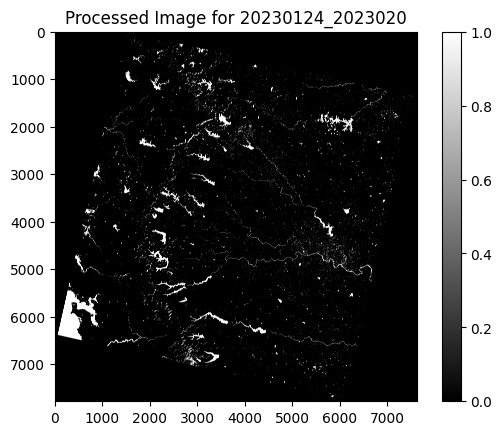

Results for D:\DatasetUSGS\2023\20230124\LC08_L2SP_147047_20230124_20230207_02_T1_MTL.txt:
20230124_2023020: 
Water Area: 1607050800.0 square meters
Land Area: 51832079100.0 square meters
Water Percentage: 3.007254801878801 %
Land Percentage: 96.9927451981212 %
--------------------------------------------------


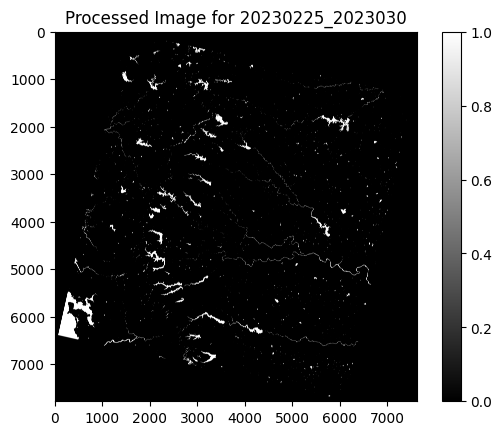

Results for D:\DatasetUSGS\2023\20230225\LC08_L2SP_147047_20230225_20230301_02_T1_MTL.txt:
20230225_2023030: 
Water Area: 1044151200.0 square meters
Land Area: 52394978700.0 square meters
Water Percentage: 1.9539075616573616 %
Land Percentage: 98.04609243834264 %
--------------------------------------------------


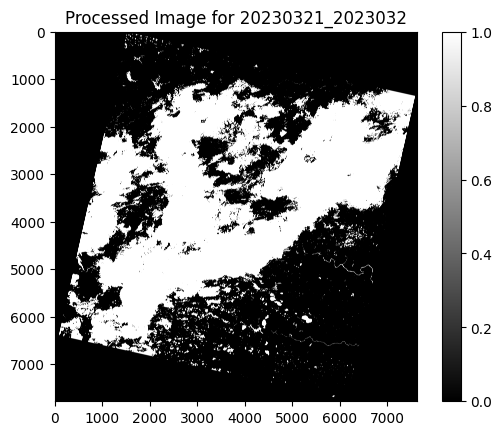

Results for D:\DatasetUSGS\2023\20230321\LC09_L2SP_147047_20230321_20230323_02_T1_MTL.txt:
20230321_2023032: 
Water Area: 17432464500.0 square meters
Land Area: 36006665400.0 square meters
Water Percentage: 32.621160809730924 %
Land Percentage: 67.37883919026908 %
--------------------------------------------------


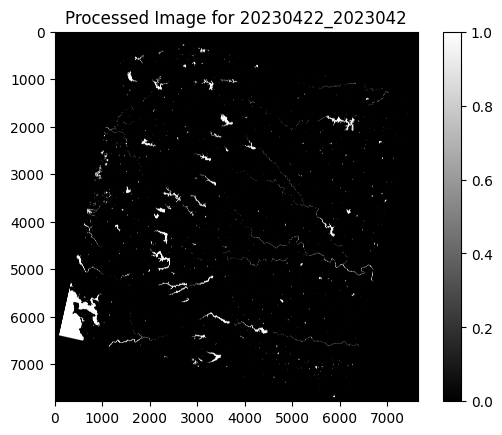

Results for D:\DatasetUSGS\2023\20230422\LC09_L2SP_147047_20230422_20230424_02_T1_MTL.txt:
20230422_2023042: 
Water Area: 987174000.0 square meters
Land Area: 52521984900.0 square meters
Water Percentage: 1.8448692154643453 %
Land Percentage: 98.15513078453564 %
--------------------------------------------------


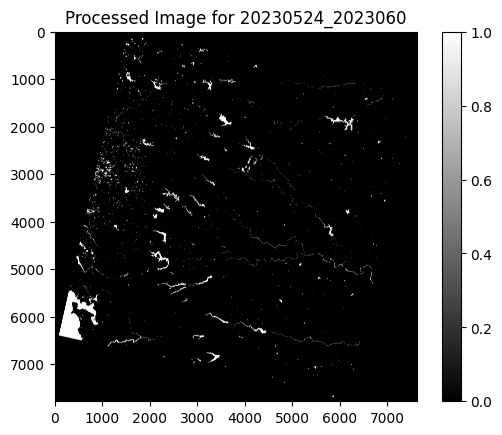

Results for D:\DatasetUSGS\2023\20230524\LC09_L2SP_147047_20230524_20230601_02_T1_MTL.txt:
20230524_2023060: 
Water Area: 964436400.0 square meters
Land Area: 52474693500.0 square meters
Water Percentage: 1.8047382167425594 %
Land Percentage: 98.19526178325744 %
--------------------------------------------------


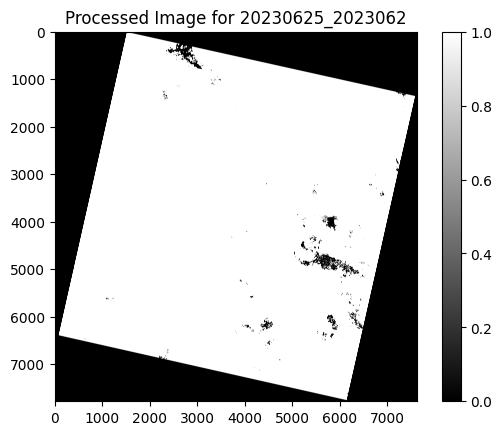

Results for D:\DatasetUSGS\2023\20230625\LC09_L2SP_147047_20230625_20230627_02_T2_MTL.txt:
20230625_2023062: 
Water Area: 36166268700.0 square meters
Land Area: 17272861200.0 square meters
Water Percentage: 67.67750292281612 %
Land Percentage: 32.32249707718389 %
--------------------------------------------------


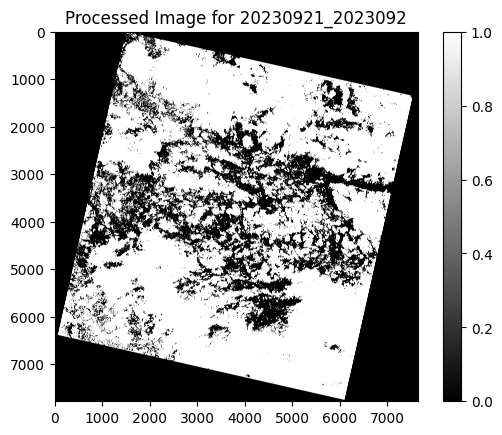

Results for D:\DatasetUSGS\2023\20230921\LC08_L2SP_147047_20230921_20230926_02_T1_MTL.txt:
20230921_2023092: 
Water Area: 27478674000.0 square meters
Land Area: 26030484900.0 square meters
Water Percentage: 51.353216094002185 %
Land Percentage: 48.64678390599782 %
--------------------------------------------------


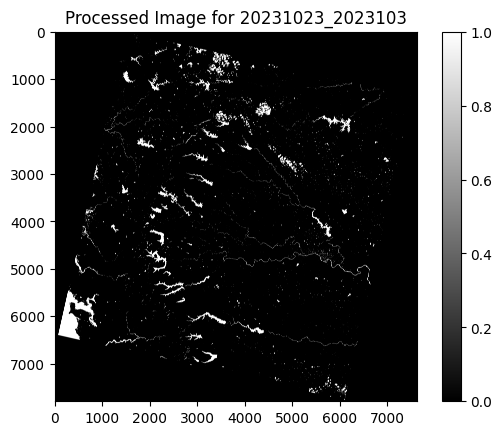

Results for D:\DatasetUSGS\2023\20231023\LC08_L2SP_147047_20231023_20231031_02_T1_MTL.txt:
20231023_2023103: 
Water Area: 1471460400.0 square meters
Land Area: 52106467500.0 square meters
Water Percentage: 2.7463928854180266 %
Land Percentage: 97.25360711458197 %
--------------------------------------------------


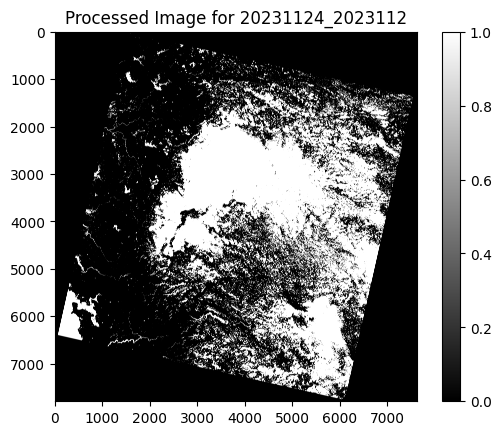

Results for D:\DatasetUSGS\2023\20231124\LC08_L2SP_147047_20231124_20231129_02_T1_MTL.txt:
20231124_2023112: 
Water Area: 15216094800.0 square meters
Land Area: 38291714100.0 square meters
Water Percentage: 28.437147984207588 %
Land Percentage: 71.56285201579242 %
--------------------------------------------------


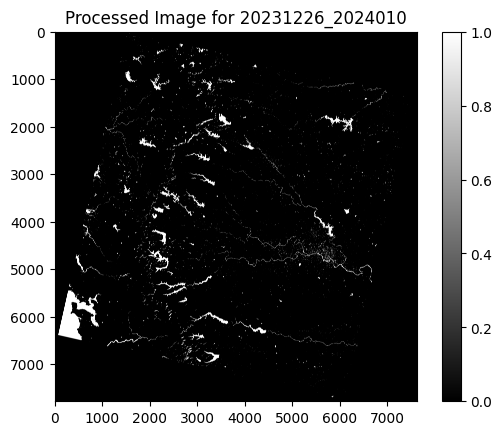

Results for D:\DatasetUSGS\2023\20231226\LC08_L2SP_147047_20231226_20240104_02_T1_MTL.txt:
20231226_2024010: 
Water Area: 1301865300.0 square meters
Land Area: 52137264600.0 square meters
Water Percentage: 2.4361648523023574 %
Land Percentage: 97.56383514769765 %
--------------------------------------------------


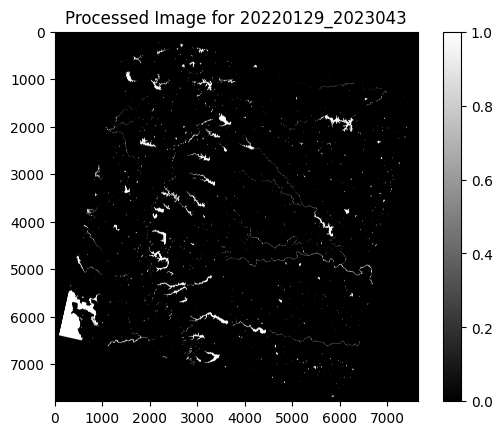

Results for D:\DatasetUSGS\2022\20220129\LC09_L2SP_147047_20220129_20230430_02_T1_MTL.txt:
20220129_2023043: 
Water Area: 1168595100.0 square meters
Land Area: 52340563800.0 square meters
Water Percentage: 2.1839160323635736 %
Land Percentage: 97.81608396763643 %
--------------------------------------------------


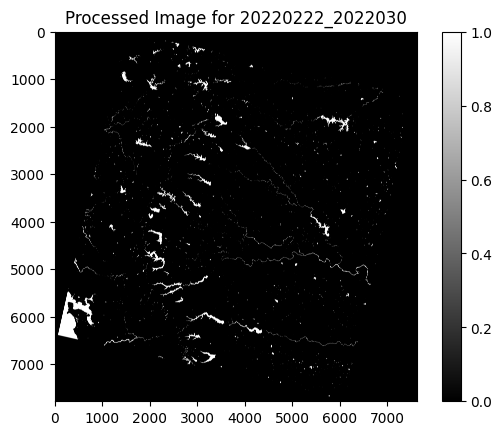

Results for D:\DatasetUSGS\2022\20220222\LC08_L2SP_147047_20220222_20220301_02_T1_MTL.txt:
20220222_2022030: 
Water Area: 1029703500.0 square meters
Land Area: 52409426400.0 square meters
Water Percentage: 1.926871754698985 %
Land Percentage: 98.073128245301 %
--------------------------------------------------


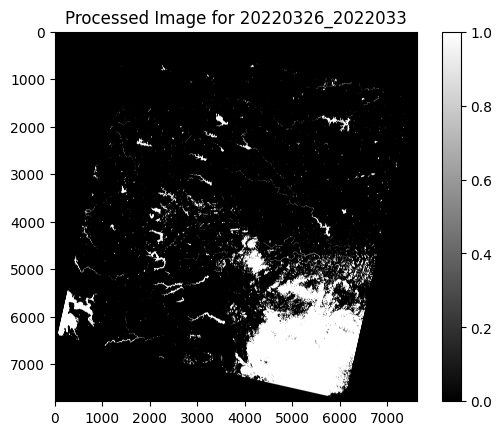

Results for D:\DatasetUSGS\2022\20220326\LC08_L2SP_147047_20220326_20220330_02_T1_MTL.txt:
20220326_2022033: 
Water Area: 5024989800.0 square meters
Land Area: 48414140100.0 square meters
Water Percentage: 9.40320287662468 %
Land Percentage: 90.59679712337531 %
--------------------------------------------------


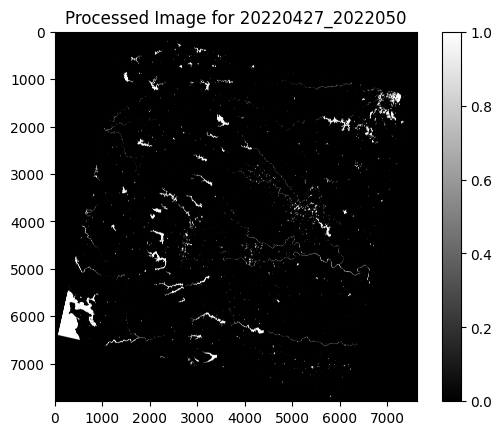

Results for D:\DatasetUSGS\2022\20220427\LC08_L2SP_147047_20220427_20220503_02_T1_MTL.txt:
20220427_2022050: 
Water Area: 1064678400.0 square meters
Land Area: 52513249500.0 square meters
Water Percentage: 1.9871585963293663 %
Land Percentage: 98.01284140367063 %
--------------------------------------------------


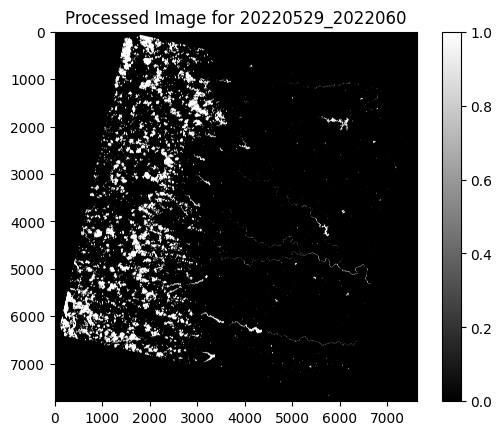

Results for D:\DatasetUSGS\2022\20220529\LC08_L2SP_147047_20220529_20220603_02_T1_MTL.txt:
20220529_2022060: 
Water Area: 2970306900.0 square meters
Land Area: 50607621000.0 square meters
Water Percentage: 5.543900289581748 %
Land Percentage: 94.45609971041826 %
--------------------------------------------------


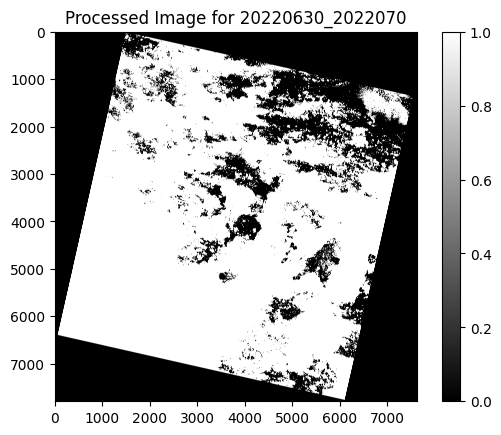

Results for D:\DatasetUSGS\2022\20220630\LC08_L2SP_147047_20220630_20220708_02_T2_MTL.txt:
20220630_2022070: 
Water Area: 30258690300.0 square meters
Land Area: 23249118600.0 square meters
Water Percentage: 56.55004553924091 %
Land Percentage: 43.449954460759095 %
--------------------------------------------------


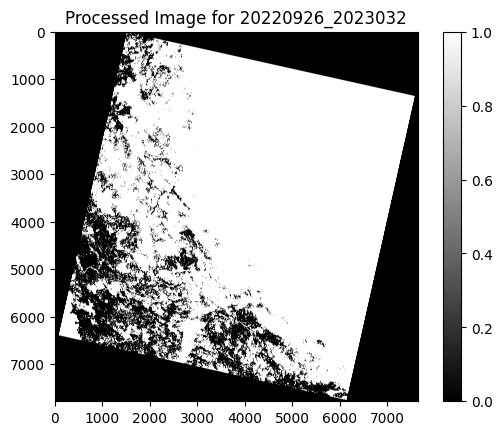

Results for D:\DatasetUSGS\2022\20220926\LC09_L2SP_147047_20220926_20230327_02_T1_MTL.txt:
20220926_2023032: 
Water Area: 30969762300.0 square meters
Land Area: 22539396600.0 square meters
Water Percentage: 57.877497865136505 %
Land Percentage: 42.122502134863495 %
--------------------------------------------------


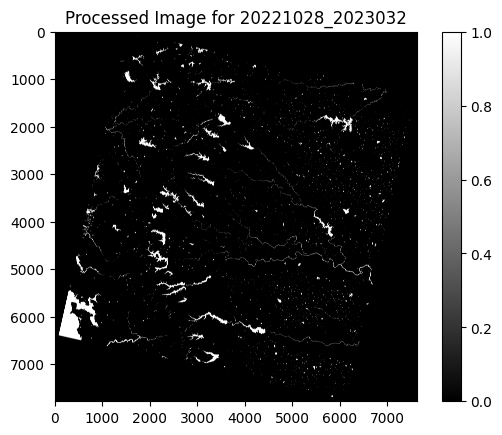

Results for D:\DatasetUSGS\2022\20221028\LC09_L2SP_147047_20221028_20230324_02_T1_MTL.txt:
20221028_2023032: 
Water Area: 1384965900.0 square meters
Land Area: 52054164000.0 square meters
Water Percentage: 2.5916700039683844 %
Land Percentage: 97.40832999603161 %
--------------------------------------------------


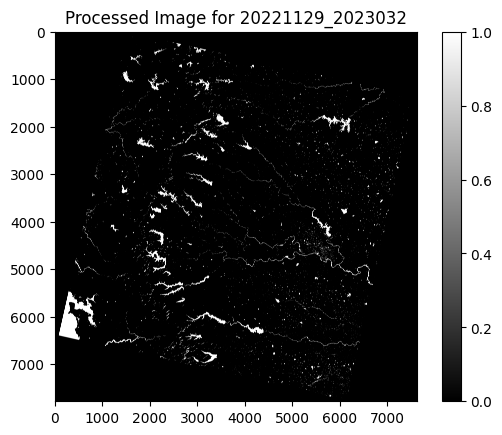

Results for D:\DatasetUSGS\2022\20221129\LC09_L2SP_147047_20221129_20230320_02_T1_MTL.txt:
20221129_2023032: 
Water Area: 1373319900.0 square meters
Land Area: 52065810000.0 square meters
Water Percentage: 2.569876984467893 %
Land Percentage: 97.4301230155321 %
--------------------------------------------------


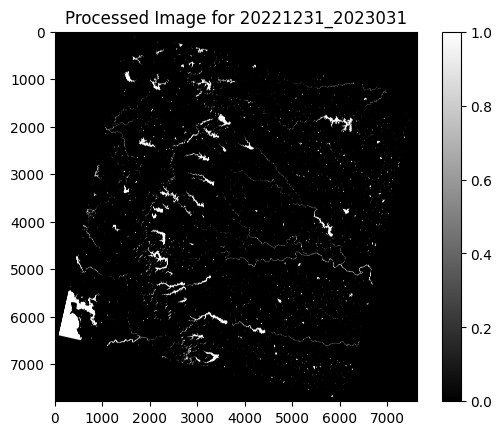

Results for D:\DatasetUSGS\2022\20221231\LC09_L2SP_147047_20221231_20230315_02_T1_MTL.txt:
20221231_2023031: 
Water Area: 1301699700.0 square meters
Land Area: 52137430200.0 square meters
Water Percentage: 2.4358549670173426 %
Land Percentage: 97.56414503298265 %
--------------------------------------------------


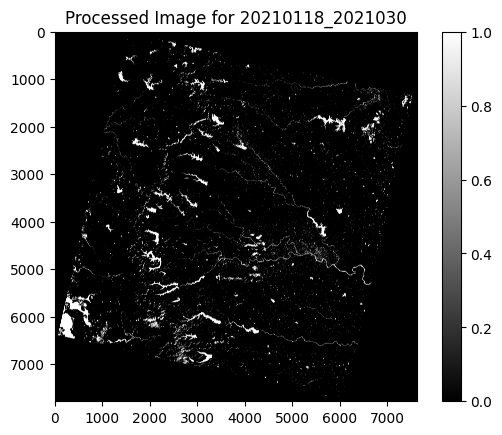

Results for D:\DatasetUSGS\2021\20210118\LC08_L2SP_147047_20210118_20210306_02_T1_MTL.txt:
20210118_2021030: 
Water Area: 1647185400.0 square meters
Land Area: 51791944500.0 square meters
Water Percentage: 3.08235819535677 %
Land Percentage: 96.91764180464322 %
--------------------------------------------------


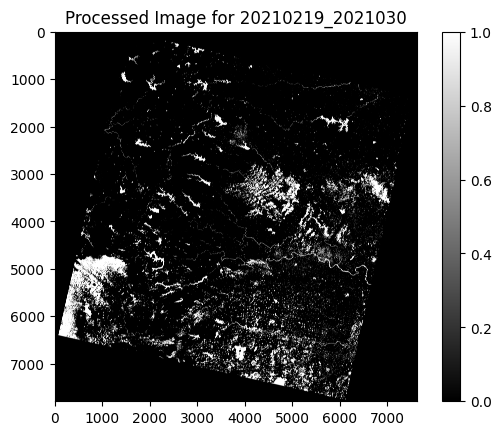

Results for D:\DatasetUSGS\2021\20210219\LC08_L2SP_147047_20210219_20210302_02_T1_MTL.txt:
20210219_2021030: 
Water Area: 3546378900.0 square meters
Land Area: 49961430000.0 square meters
Water Percentage: 6.627778212013462 %
Land Percentage: 93.37222178798655 %
--------------------------------------------------


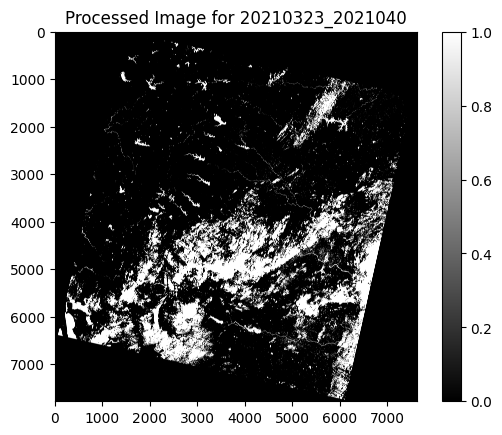

Results for D:\DatasetUSGS\2021\20210323\LC08_L2SP_147047_20210323_20210402_02_T1_MTL.txt:
20210323_2021040: 
Water Area: 6728328000.0 square meters
Land Area: 46710801900.0 square meters
Water Percentage: 12.590639130147963 %
Land Percentage: 87.40936086985204 %
--------------------------------------------------


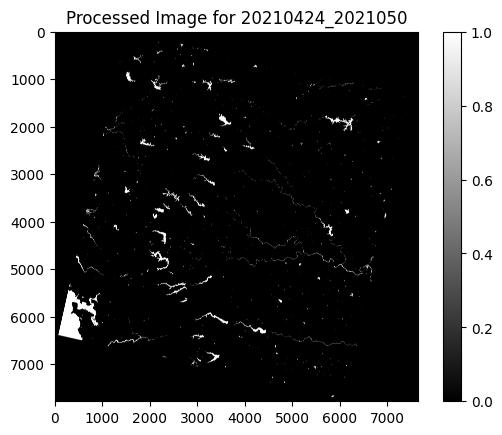

Results for D:\DatasetUSGS\2021\20210424\LC08_L2SP_147047_20210424_20210501_02_T1_MTL.txt:
20210424_2021050: 
Water Area: 917853300.0 square meters
Land Area: 52591305600.0 square meters
Water Percentage: 1.7153199916958517 %
Land Percentage: 98.28468000830415 %
--------------------------------------------------


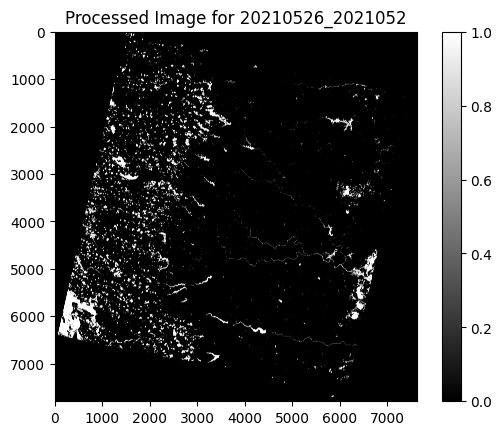

Results for D:\DatasetUSGS\2021\20210526\LC08_L2SP_147047_20210526_20210529_02_T1_MTL.txt:
20210526_2021052: 
Water Area: 2137941900.0 square meters
Land Area: 51439986000.0 square meters
Water Percentage: 3.9903407686656727 %
Land Percentage: 96.00965923133433 %
--------------------------------------------------


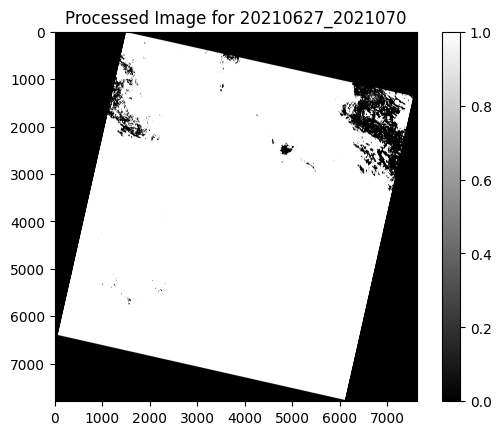

Results for D:\DatasetUSGS\2021\20210627\LC08_L2SP_147047_20210627_20210707_02_T2_MTL.txt:
20210627_2021070: 
Water Area: 35047286100.0 square meters
Land Area: 18460522800.0 square meters
Water Percentage: 65.4993856420086 %
Land Percentage: 34.5006143579914 %
--------------------------------------------------


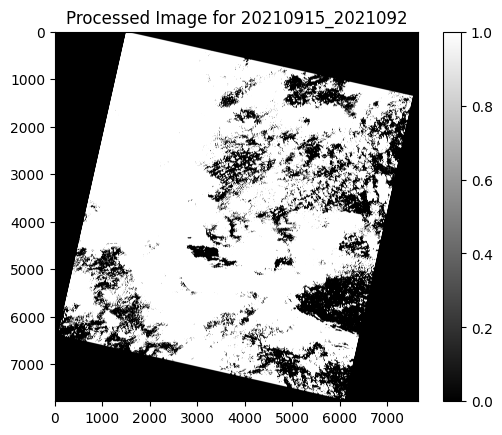

Results for D:\DatasetUSGS\2021\20210915\LC08_L2SP_147047_20210915_20210924_02_T2_MTL.txt:
20210915_2021092: 
Water Area: 29217492900.0 square meters
Land Area: 24291666000.0 square meters
Water Percentage: 54.60278857046285 %
Land Percentage: 45.39721142953716 %
--------------------------------------------------


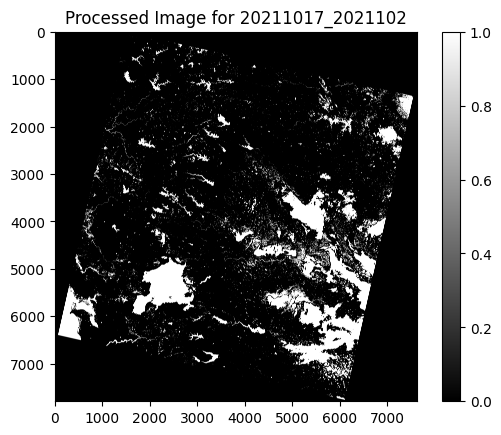

Results for D:\DatasetUSGS\2021\20211017\LC08_L2SP_147047_20211017_20211026_02_T1_MTL.txt:
20211017_2021102: 
Water Area: 5430565800.0 square meters
Land Area: 48077243100.0 square meters
Water Percentage: 10.149108908849378 %
Land Percentage: 89.85089109115061 %
--------------------------------------------------


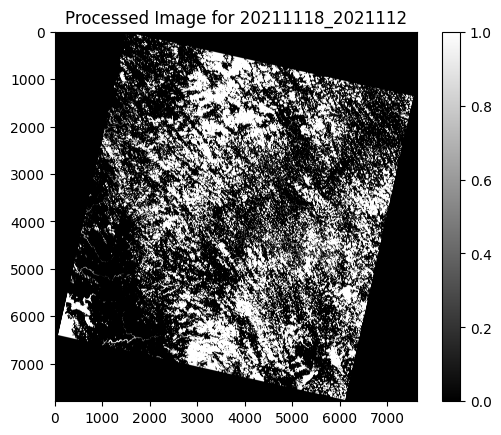

Results for D:\DatasetUSGS\2021\20211118\LC08_L2SP_147047_20211118_20211125_02_T1_MTL.txt:
20211118_2021112: 
Water Area: 12537675900.0 square meters
Land Area: 40970133000.0 square meters
Water Percentage: 23.431488146770292 %
Land Percentage: 76.56851185322971 %
--------------------------------------------------


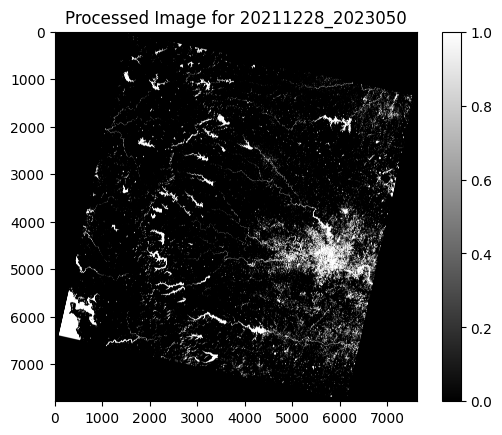

Results for D:\DatasetUSGS\2021\20211228\LC09_L2SP_147047_20211228_20230503_02_T1_MTL.txt:
20211228_2023050: 
Water Area: 3040088400.0 square meters
Land Area: 50399041500.0 square meters
Water Percentage: 5.688880798936811 %
Land Percentage: 94.31111920106319 %
--------------------------------------------------


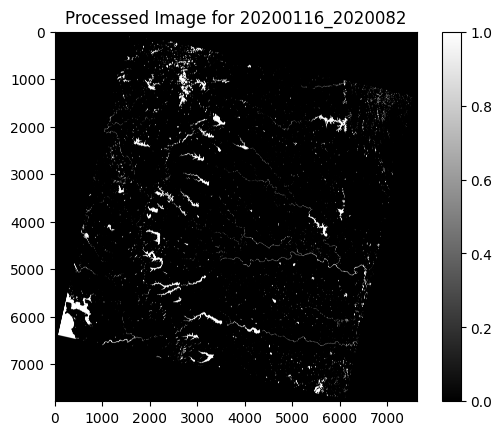

Results for D:\DatasetUSGS\2020\20200116\LC08_L2SP_147047_20200116_20200823_02_T1_MTL.txt:
20200116_2020082: 
Water Area: 1321272900.0 square meters
Land Area: 52117857000.0 square meters
Water Percentage: 2.4724820603787565 %
Land Percentage: 97.52751793962125 %
--------------------------------------------------


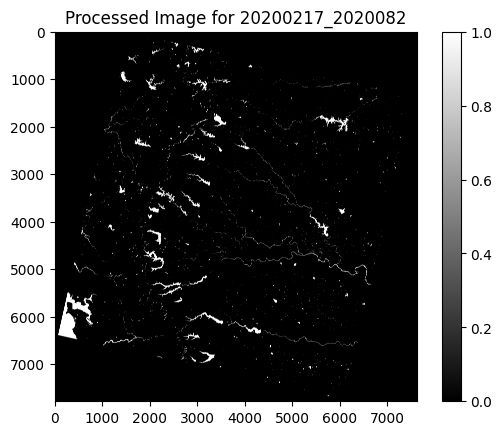

Results for D:\DatasetUSGS\2020\20200217\LC08_L2SP_147047_20200217_20200823_02_T1_MTL.txt:
20200217_2020082: 
Water Area: 1075707000.0 square meters
Land Area: 52363422900.0 square meters
Water Percentage: 2.0129575500442423 %
Land Percentage: 97.98704244995577 %
--------------------------------------------------


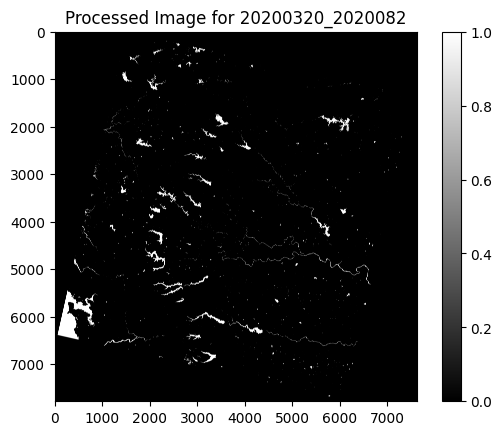

Results for D:\DatasetUSGS\2020\20200320\LC08_L2SP_147047_20200320_20200822_02_T1_MTL.txt:
20200320_2020082: 
Water Area: 925247700.0 square meters
Land Area: 52513882200.0 square meters
Water Percentage: 1.7314048745393213 %
Land Percentage: 98.26859512546068 %
--------------------------------------------------


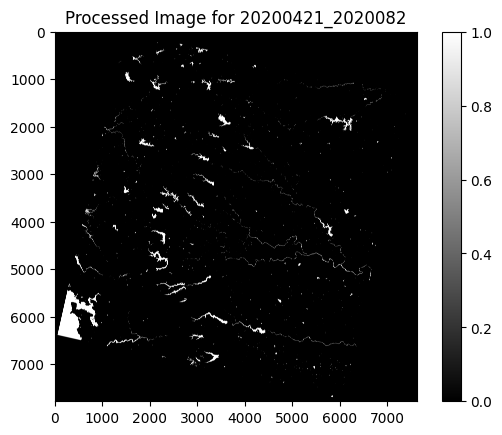

Results for D:\DatasetUSGS\2020\20200421\LC08_L2SP_147047_20200421_20200822_02_T1_MTL.txt:
20200421_2020082: 
Water Area: 963237600.0 square meters
Land Area: 52475892300.0 square meters
Water Percentage: 1.8024949167445186 %
Land Percentage: 98.19750508325548 %
--------------------------------------------------


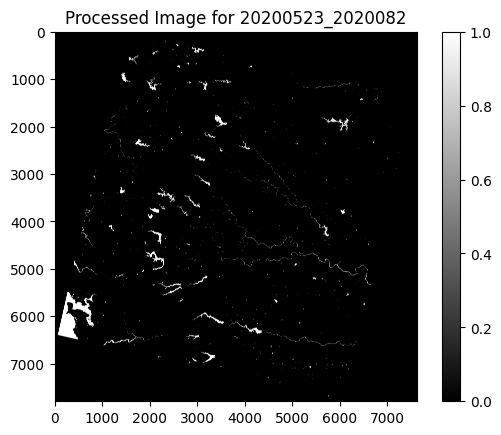

Results for D:\DatasetUSGS\2020\20200523\LC08_L2SP_147047_20200523_20200820_02_T1_MTL.txt:
20200523_2020082: 
Water Area: 755202600.0 square meters
Land Area: 52752606300.0 square meters
Water Percentage: 1.4113876376649763 %
Land Percentage: 98.58861236233503 %
--------------------------------------------------


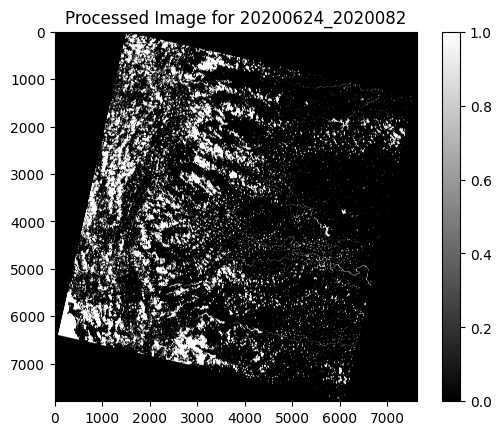

Results for D:\DatasetUSGS\2020\20200624\LC08_L2SP_147047_20200624_20200823_02_T1_MTL.txt:
20200624_2020082: 
Water Area: 6513503400.0 square meters
Land Area: 46994305500.0 square meters
Water Percentage: 12.172995930693025 %
Land Percentage: 87.82700406930698 %
--------------------------------------------------


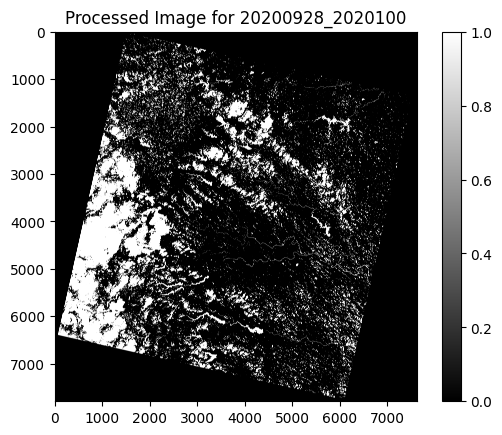

Results for D:\DatasetUSGS\2020\20200928\LC08_L2SP_147047_20200928_20201006_02_T1_MTL.txt:
20200928_2020100: 
Water Area: 8075344500.0 square meters
Land Area: 45502583400.0 square meters
Water Percentage: 15.072147834966943 %
Land Percentage: 84.92785216503306 %
--------------------------------------------------


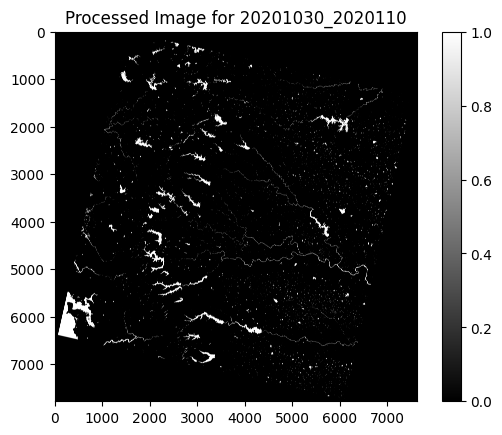

Results for D:\DatasetUSGS\2020\20201030\LC08_L2SP_147047_20201030_20201106_02_T1_MTL.txt:
20201030_2020110: 
Water Area: 1310182200.0 square meters
Land Area: 52128947700.0 square meters
Water Percentage: 2.4517281670785587 %
Land Percentage: 97.54827183292144 %
--------------------------------------------------


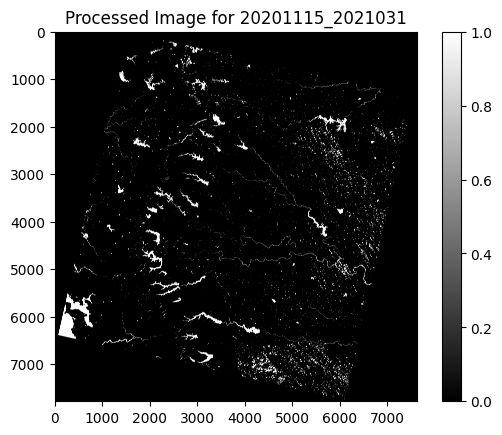

Results for D:\DatasetUSGS\2020\20201115\LC08_L2SP_147047_20201115_20210315_02_T1_MTL.txt:
20201115_2021031: 
Water Area: 1558963800.0 square meters
Land Area: 51880166100.0 square meters
Water Percentage: 2.9172701780834944 %
Land Percentage: 97.0827298219165 %
--------------------------------------------------


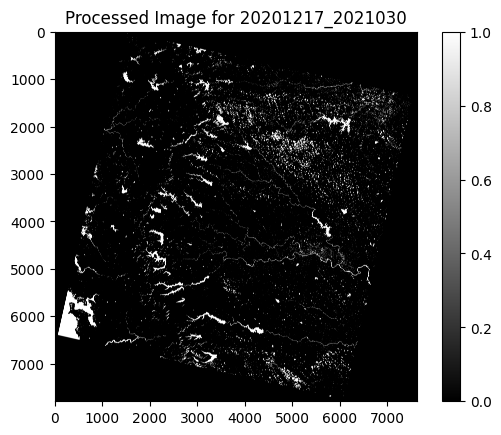

Results for D:\DatasetUSGS\2020\20201217\LC08_L2SP_147047_20201217_20210309_02_T1_MTL.txt:
20201217_2021030: 
Water Area: 2116853100.0 square meters
Land Area: 51390955800.0 square meters
Water Percentage: 3.956157322674448 %
Land Percentage: 96.04384267732556 %
--------------------------------------------------


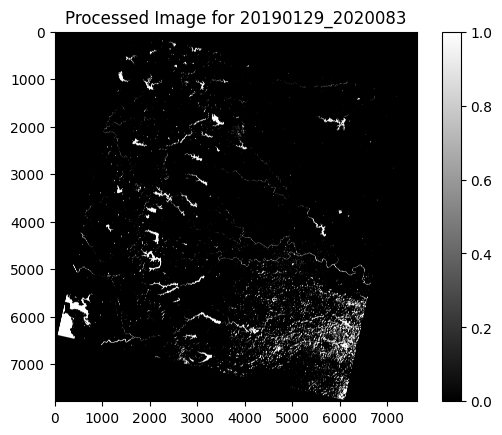

Results for D:\DatasetUSGS\2019\20190129\LC08_L2SP_147047_20190129_20200830_02_T1_MTL.txt:
20190129_2020083: 
Water Area: 1510974000.0 square meters
Land Area: 51928155900.0 square meters
Water Percentage: 2.8274674434772185 %
Land Percentage: 97.17253255652278 %
--------------------------------------------------


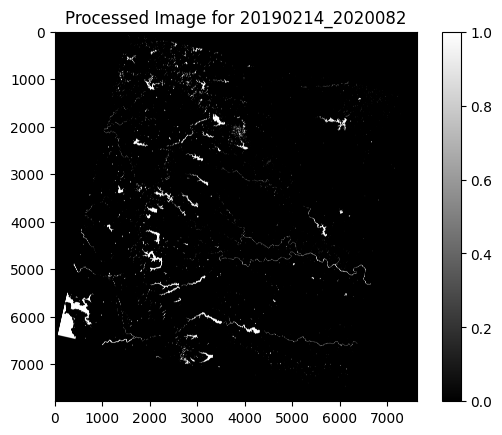

Results for D:\DatasetUSGS\2019\20190214\LC08_L2SP_147047_20190214_20200829_02_T1_MTL.txt:
20190214_2020082: 
Water Area: 880310700.0 square meters
Land Area: 52558819200.0 square meters
Water Percentage: 1.6473148077959257 %
Land Percentage: 98.35268519220406 %
--------------------------------------------------


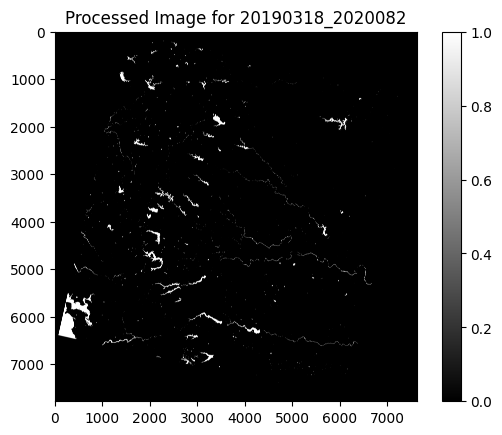

Results for D:\DatasetUSGS\2019\20190318\LC08_L2SP_147047_20190318_20200829_02_T1_MTL.txt:
20190318_2020082: 
Water Area: 717586200.0 square meters
Land Area: 52721543700.0 square meters
Water Percentage: 1.3428104112900237 %
Land Percentage: 98.65718958870998 %
--------------------------------------------------


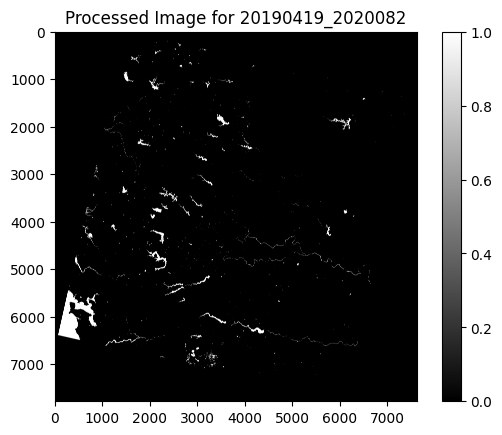

Results for D:\DatasetUSGS\2019\20190419\LC08_L2SP_147047_20190419_20200828_02_T1_MTL.txt:
20190419_2020082: 
Water Area: 744350400.0 square meters
Land Area: 52694779500.0 square meters
Water Percentage: 1.3928939363213697 %
Land Percentage: 98.60710606367863 %
--------------------------------------------------


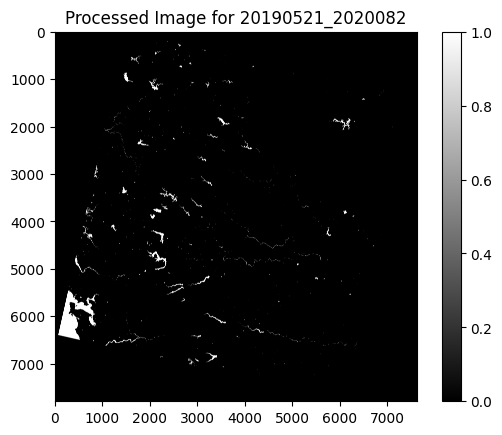

Results for D:\DatasetUSGS\2019\20190521\LC08_L2SP_147047_20190521_20200828_02_T1_MTL.txt:
20190521_2020082: 
Water Area: 629012700.0 square meters
Land Area: 52948915200.0 square meters
Water Percentage: 1.1740146076085933 %
Land Percentage: 98.8259853923914 %
--------------------------------------------------


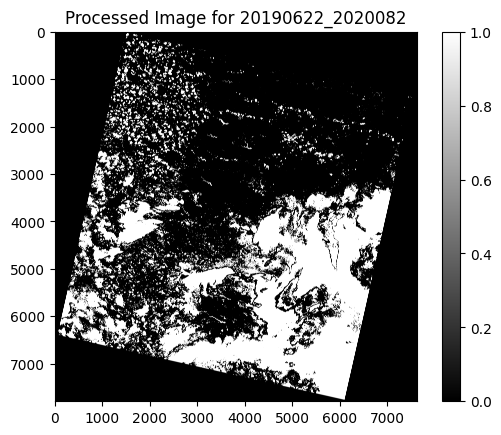

Results for D:\DatasetUSGS\2019\20190622\LC08_L2SP_147047_20190622_20200827_02_T1_MTL.txt:
20190622_2020082: 
Water Area: 12967036200.0 square meters
Land Area: 40540772700.0 square meters
Water Percentage: 24.233913640967646 %
Land Percentage: 75.76608635903236 %
--------------------------------------------------


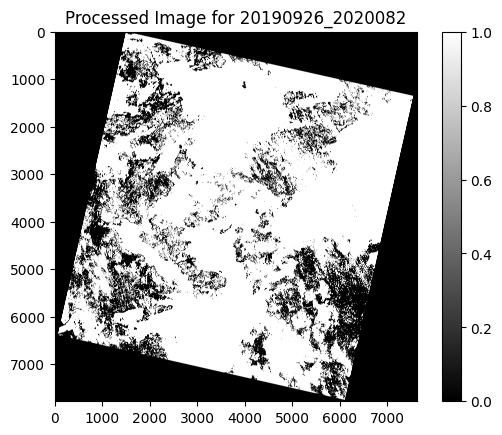

Results for D:\DatasetUSGS\2019\20190926\LC08_L2SP_147047_20190926_20200825_02_T1_MTL.txt:
20190926_2020082: 
Water Area: 29255549400.0 square meters
Land Area: 24183580500.0 square meters
Water Percentage: 54.74555715024844 %
Land Percentage: 45.25444284975156 %
--------------------------------------------------


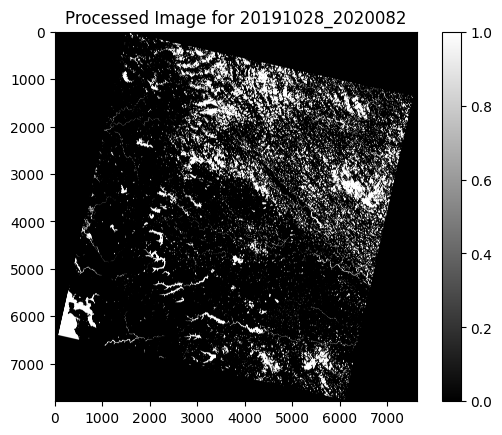

Results for D:\DatasetUSGS\2019\20191028\LC08_L2SP_147047_20191028_20200825_02_T1_MTL.txt:
20191028_2020082: 
Water Area: 5324785200.0 square meters
Land Area: 48253142700.0 square meters
Water Percentage: 9.938393306173381 %
Land Percentage: 90.06160669382662 %
--------------------------------------------------


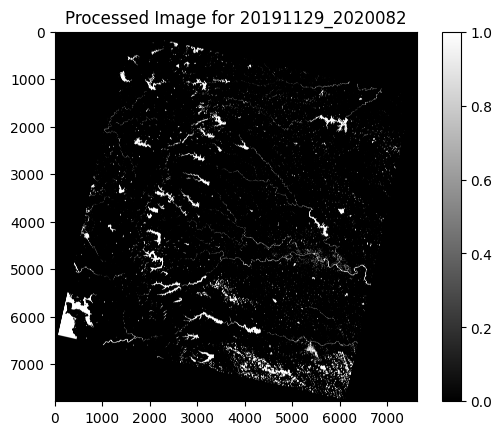

Results for D:\DatasetUSGS\2019\20191129\LC08_L2SP_147047_20191129_20200825_02_T1_MTL.txt:
20191129_2020082: 
Water Area: 1771963200.0 square meters
Land Area: 51667166700.0 square meters
Water Percentage: 3.3158533892970437 %
Land Percentage: 96.68414661070295 %
--------------------------------------------------


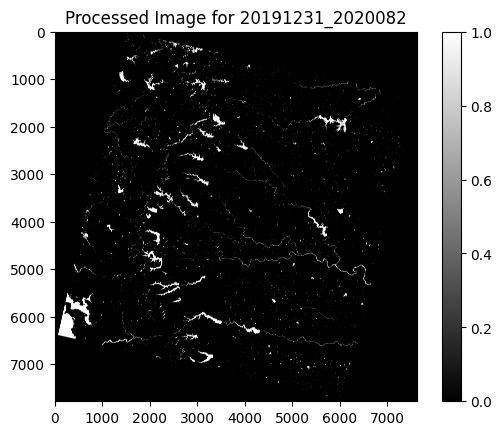

Results for D:\DatasetUSGS\2019\20191231\LC08_L2SP_147047_20191231_20200824_02_T1_MTL.txt:
20191231_2020082: 
Water Area: 1193689800.0 square meters
Land Area: 52245440100.0 square meters
Water Percentage: 2.2337373423439666 %
Land Percentage: 97.76626265765603 %
--------------------------------------------------


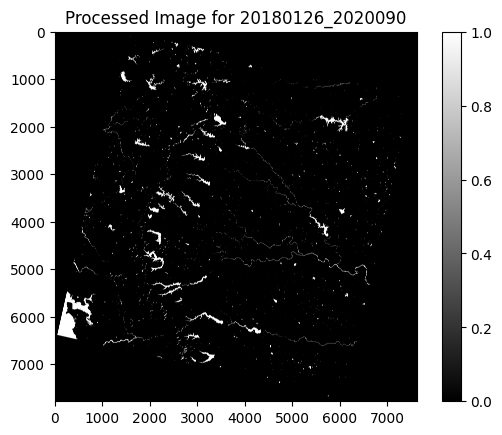

Results for D:\DatasetUSGS\2018\20180126\LC08_L2SP_147047_20180126_20200902_02_T1_MTL.txt:
20180126_2020090: 
Water Area: 1063218600.0 square meters
Land Area: 52375911300.0 square meters
Water Percentage: 1.9895881575721541 %
Land Percentage: 98.01041184242784 %
--------------------------------------------------


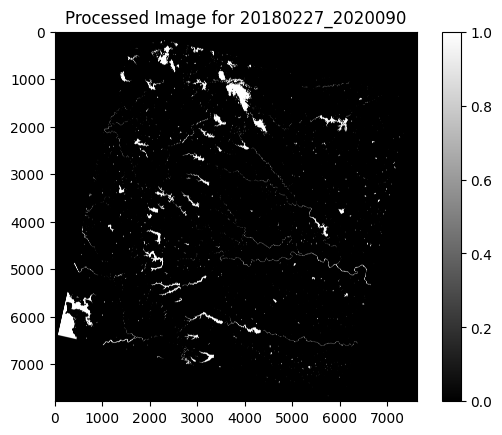

Results for D:\DatasetUSGS\2018\20180227\LC08_L2SP_147047_20180227_20200902_02_T1_MTL.txt:
20180227_2020090: 
Water Area: 1226209500.0 square meters
Land Area: 52212920400.0 square meters
Water Percentage: 2.294591065188732 %
Land Percentage: 97.70540893481126 %
--------------------------------------------------


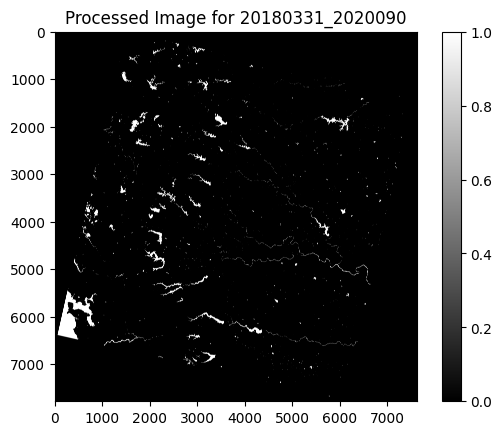

Results for D:\DatasetUSGS\2018\20180331\LC08_L2SP_147047_20180331_20200901_02_T1_MTL.txt:
20180331_2020090: 
Water Area: 952211700.0 square meters
Land Area: 52486918200.0 square meters
Water Percentage: 1.781862282903674 %
Land Percentage: 98.21813771709633 %
--------------------------------------------------


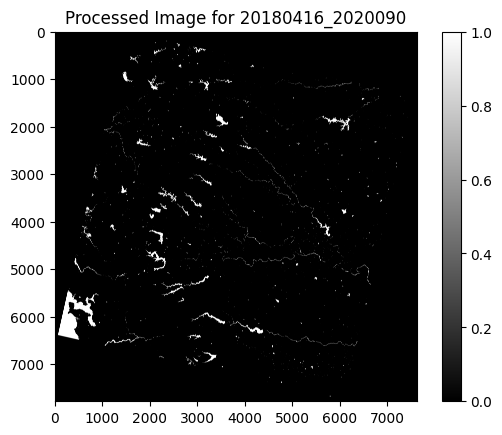

Results for D:\DatasetUSGS\2018\20180416\LC08_L2SP_147047_20180416_20200901_02_T1_MTL.txt:
20180416_2020090: 
Water Area: 896310000.0 square meters
Land Area: 52542819900.0 square meters
Water Percentage: 1.6772541051421574 %
Land Percentage: 98.32274589485785 %
--------------------------------------------------


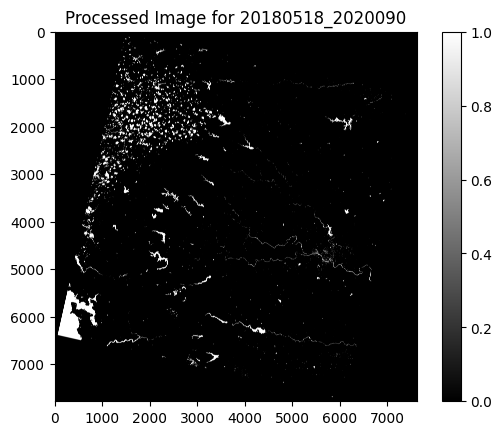

Results for D:\DatasetUSGS\2018\20180518\LC08_L2SP_147047_20180518_20200901_02_T1_MTL.txt:
20180518_2020090: 
Water Area: 1329726600.0 square meters
Land Area: 52109403300.0 square meters
Water Percentage: 2.488301367346926 %
Land Percentage: 97.51169863265308 %
--------------------------------------------------


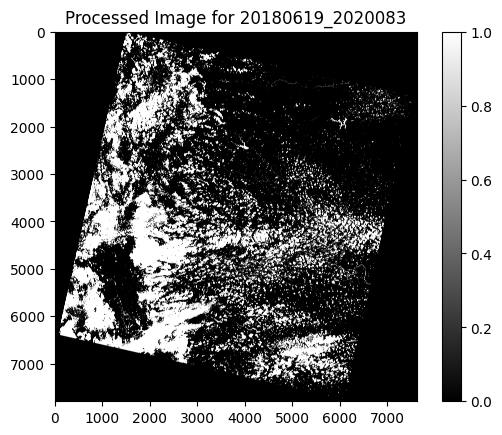

Results for D:\DatasetUSGS\2018\20180619\LC08_L2SP_147047_20180619_20200831_02_T1_MTL.txt:
20180619_2020083: 
Water Area: 10616553000.0 square meters
Land Area: 42961374900.0 square meters
Water Percentage: 19.815161608741498 %
Land Percentage: 80.18483839125851 %
--------------------------------------------------


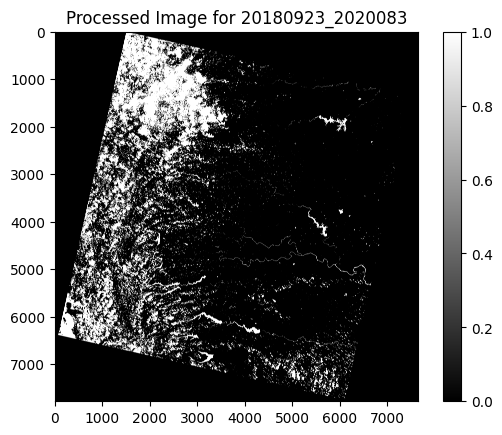

Results for D:\DatasetUSGS\2018\20180923\LC08_L2SP_147047_20180923_20200830_02_T1_MTL.txt:
20180923_2020083: 
Water Area: 6665353200.0 square meters
Land Area: 46843805700.0 square meters
Water Percentage: 12.456471634055157 %
Land Percentage: 87.54352836594485 %
--------------------------------------------------


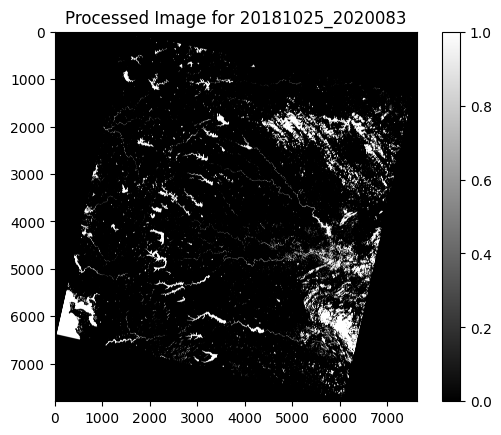

Results for D:\DatasetUSGS\2018\20181025\LC08_L2SP_147047_20181025_20200830_02_T1_MTL.txt:
20181025_2020083: 
Water Area: 2938097700.0 square meters
Land Area: 50569711200.0 square meters
Water Percentage: 5.490969935791933 %
Land Percentage: 94.50903006420806 %
--------------------------------------------------


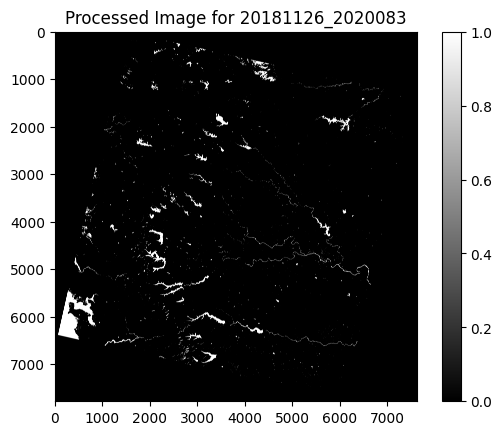

Results for D:\DatasetUSGS\2018\20181126\LC08_L2SP_147047_20181126_20200830_02_T1_MTL.txt:
20181126_2020083: 
Water Area: 998640900.0 square meters
Land Area: 52440489000.0 square meters
Water Percentage: 1.868744685530518 %
Land Percentage: 98.13125531446948 %
--------------------------------------------------


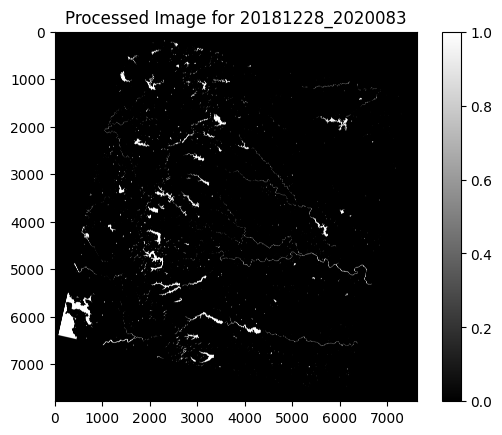

Results for D:\DatasetUSGS\2018\20181228\LC08_L2SP_147047_20181228_20200830_02_T1_MTL.txt:
20181228_2020083: 
Water Area: 923801400.0 square meters
Land Area: 52515328500.0 square meters
Water Percentage: 1.7286984307729156 %
Land Percentage: 98.27130156922709 %
--------------------------------------------------


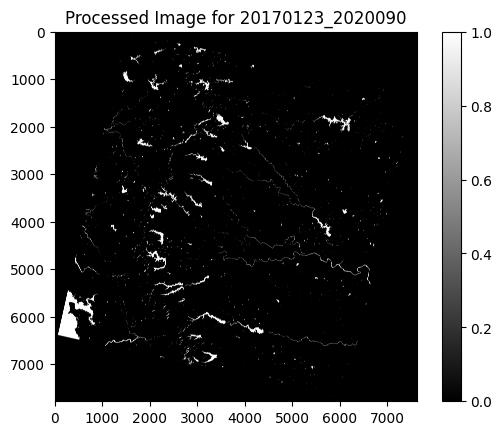

Results for D:\DatasetUSGS\2017\20170123\LC08_L2SP_147047_20170123_20200905_02_T1_MTL.txt:
20170123_2020090: 
Water Area: 1073558700.0 square meters
Land Area: 52365571200.0 square meters
Water Percentage: 2.0089374621348393 %
Land Percentage: 97.99106253786516 %
--------------------------------------------------


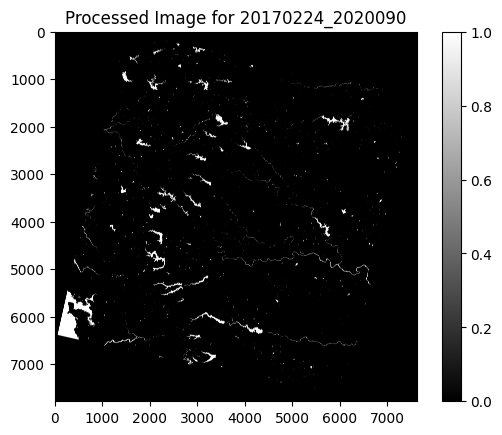

Results for D:\DatasetUSGS\2017\20170224\LC08_L2SP_147047_20170224_20200905_02_T1_MTL.txt:
20170224_2020090: 
Water Area: 922316400.0 square meters
Land Area: 52516813500.0 square meters
Water Percentage: 1.7259195681627295 %
Land Percentage: 98.27408043183728 %
--------------------------------------------------


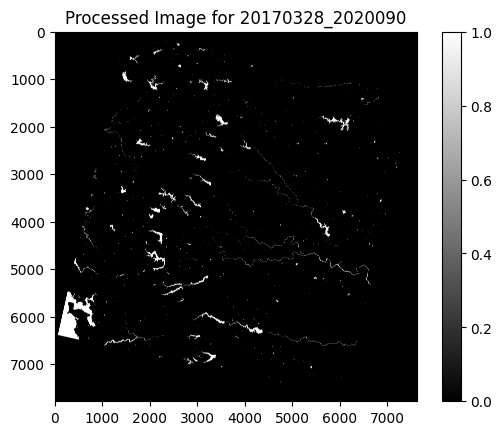

Results for D:\DatasetUSGS\2017\20170328\LC08_L2SP_147047_20170328_20200904_02_T1_MTL.txt:
20170328_2020090: 
Water Area: 851368500.0 square meters
Land Area: 52587761400.0 square meters
Water Percentage: 1.5931556176029729 %
Land Percentage: 98.40684438239703 %
--------------------------------------------------


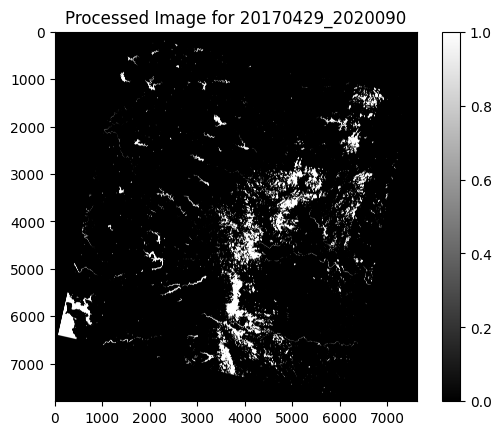

Results for D:\DatasetUSGS\2017\20170429\LC08_L2SP_147047_20170429_20200904_02_T1_MTL.txt:
20170429_2020090: 
Water Area: 2200930200.0 square meters
Land Area: 51306878700.0 square meters
Water Percentage: 4.113287845729747 %
Land Percentage: 95.88671215427024 %
--------------------------------------------------


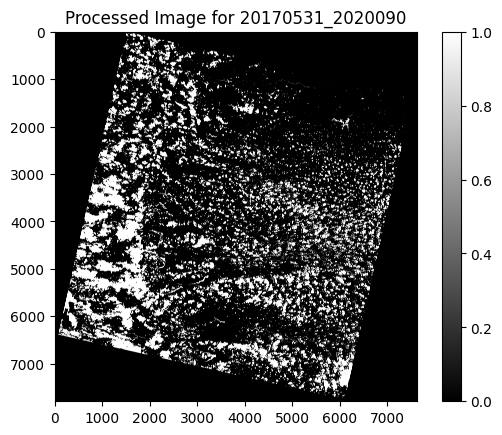

Results for D:\DatasetUSGS\2017\20170531\LC08_L2SP_147047_20170531_20200903_02_T1_MTL.txt:
20170531_2020090: 
Water Area: 8516289600.0 square meters
Land Area: 45061638300.0 square meters
Water Percentage: 15.895145508230826 %
Land Percentage: 84.10485449176917 %
--------------------------------------------------


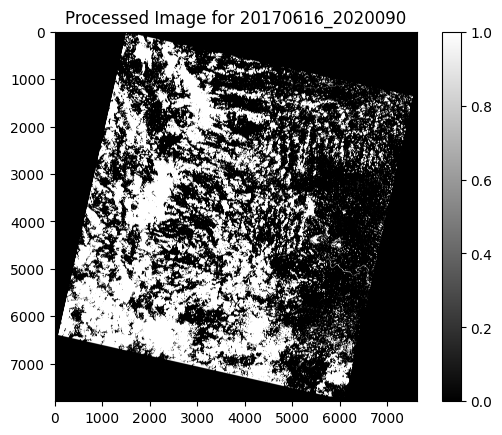

Results for D:\DatasetUSGS\2017\20170616\LC08_L2SP_147047_20170616_20200903_02_T1_MTL.txt:
20170616_2020090: 
Water Area: 14853268800.0 square meters
Land Area: 38724659100.0 square meters
Water Percentage: 27.722738415197277 %
Land Percentage: 72.27726158480272 %
--------------------------------------------------


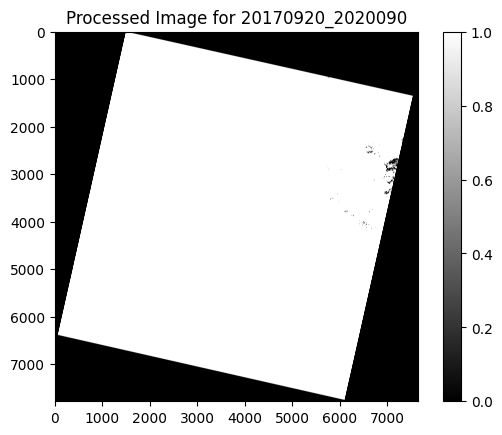

Results for D:\DatasetUSGS\2017\20170920\LC08_L2SP_147047_20170920_20200903_02_T2_MTL.txt:
20170920_2020090: 
Water Area: 36409395600.0 square meters
Land Area: 17099763300.0 square meters
Water Percentage: 68.04329641593377 %
Land Percentage: 31.956703584066243 %
--------------------------------------------------


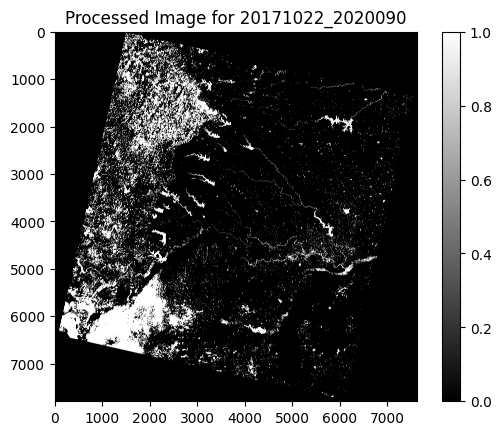

Results for D:\DatasetUSGS\2017\20171022\LC08_L2SP_147047_20171022_20200902_02_T1_MTL.txt:
20171022_2020090: 
Water Area: 5524609500.0 square meters
Land Area: 47983199400.0 square meters
Water Percentage: 10.324865872054051 %
Land Percentage: 89.67513412794595 %
--------------------------------------------------


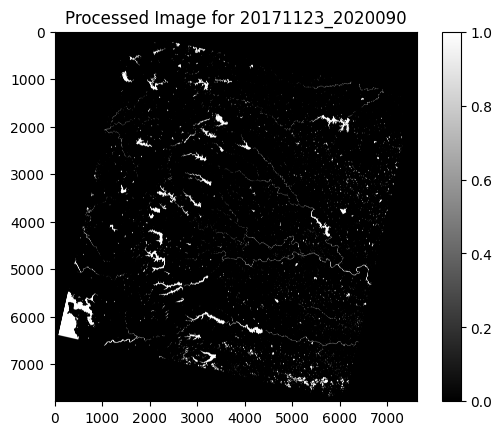

Results for D:\DatasetUSGS\2017\20171123\LC08_L2SP_147047_20171123_20200902_02_T1_MTL.txt:
20171123_2020090: 
Water Area: 1369697400.0 square meters
Land Area: 52069432500.0 square meters
Water Percentage: 2.563098243858196 %
Land Percentage: 97.43690175614181 %
--------------------------------------------------


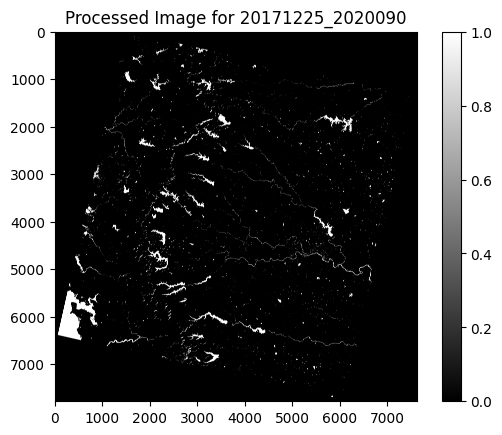

Results for D:\DatasetUSGS\2017\20171225\LC08_L2SP_147047_20171225_20200902_02_T1_MTL.txt:
20171225_2020090: 
Water Area: 1361017800.0 square meters
Land Area: 52078112100.0 square meters
Water Percentage: 2.5468562129414463 %
Land Percentage: 97.45314378705855 %
--------------------------------------------------


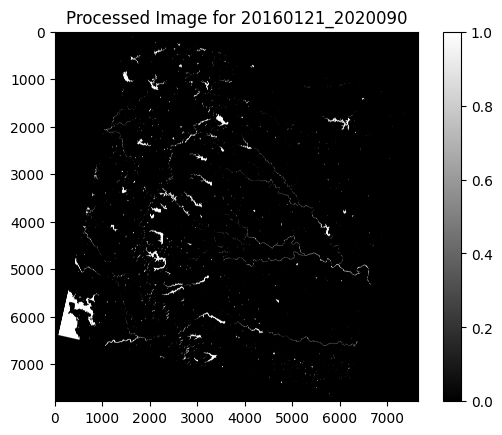

Results for D:\DatasetUSGS\2016\20160121\LC08_L2SP_147047_20160121_20200907_02_T1_MTL.txt:
20160121_2020090: 
Water Area: 908544600.0 square meters
Land Area: 52600614300.0 square meters
Water Percentage: 1.697923530620101 %
Land Percentage: 98.3020764693799 %
--------------------------------------------------


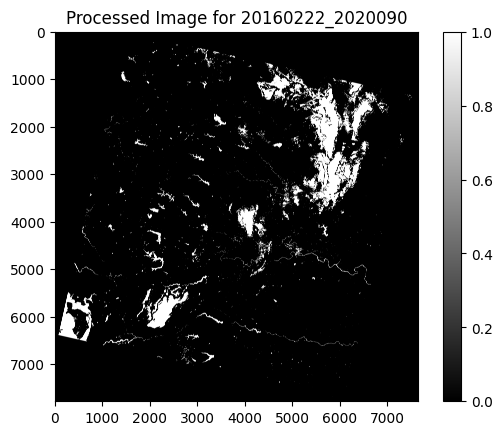

Results for D:\DatasetUSGS\2016\20160222\LC08_L2SP_147047_20160222_20200907_02_T1_MTL.txt:
20160222_2020090: 
Water Area: 2998697400.0 square meters
Land Area: 50510461500.0 square meters
Water Percentage: 5.60408248166278 %
Land Percentage: 94.39591751833723 %
--------------------------------------------------


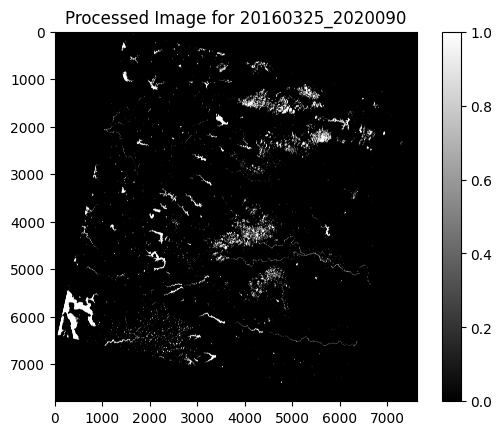

Results for D:\DatasetUSGS\2016\20160325\LC08_L2SP_147047_20160325_20200907_02_T1_MTL.txt:
20160325_2020090: 
Water Area: 1356159600.0 square meters
Land Area: 52082970300.0 square meters
Water Percentage: 2.5377651218082424 %
Land Percentage: 97.46223487819175 %
--------------------------------------------------


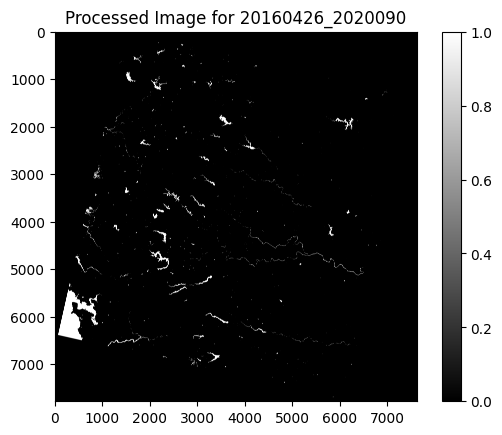

Results for D:\DatasetUSGS\2016\20160426\LC08_L2SP_147047_20160426_20200907_02_T1_MTL.txt:
20160426_2020090: 
Water Area: 732773700.0 square meters
Land Area: 52706356200.0 square meters
Water Percentage: 1.3712305970760201 %
Land Percentage: 98.62876940292398 %
--------------------------------------------------


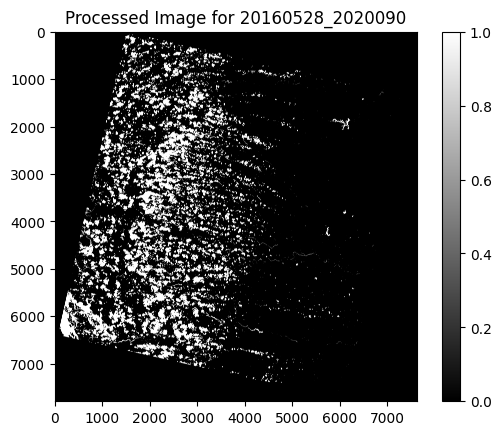

Results for D:\DatasetUSGS\2016\20160528\LC08_L2SP_147047_20160528_20200906_02_T1_MTL.txt:
20160528_2020090: 
Water Area: 5441694300.0 square meters
Land Area: 48066114600.0 square meters
Water Percentage: 10.169906807751943 %
Land Percentage: 89.83009319224806 %
--------------------------------------------------


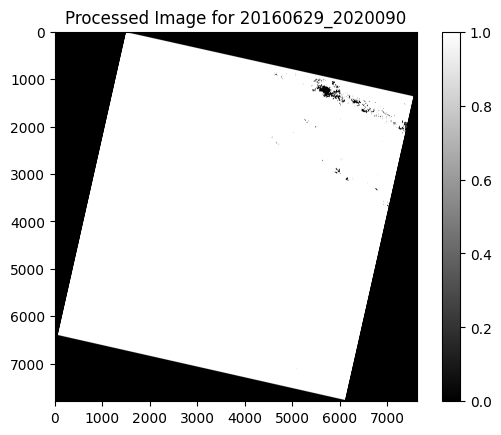

Results for D:\DatasetUSGS\2016\20160629\LC08_L2SP_147047_20160629_20200906_02_T2_MTL.txt:
20160629_2020090: 
Water Area: 36328587300.0 square meters
Land Area: 17179221600.0 square meters
Water Percentage: 67.89399163754582 %
Land Percentage: 32.106008362454176 %
--------------------------------------------------


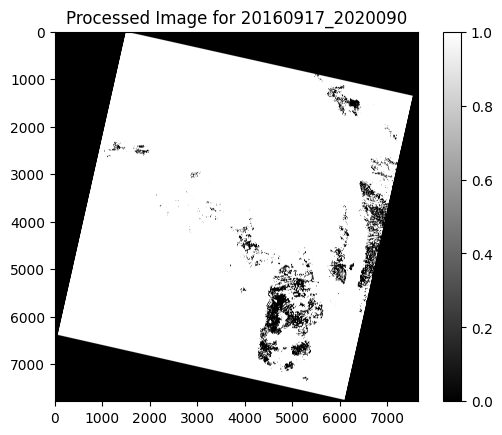

Results for D:\DatasetUSGS\2016\20160917\LC08_L2SP_147047_20160917_20200906_02_T2_MTL.txt:
20160917_2020090: 
Water Area: 34956388800.0 square meters
Land Area: 18552770100.0 square meters
Water Percentage: 65.32786072255006 %
Land Percentage: 34.672139277449936 %
--------------------------------------------------


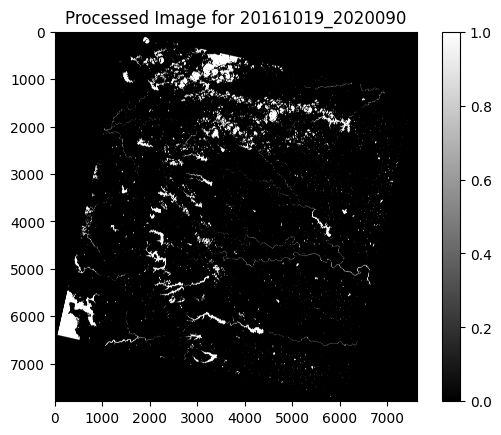

Results for D:\DatasetUSGS\2016\20161019\LC08_L2SP_147047_20161019_20200905_02_T1_MTL.txt:
20161019_2020090: 
Water Area: 2069267400.0 square meters
Land Area: 51438541500.0 square meters
Water Percentage: 3.867225069647731 %
Land Percentage: 96.13277493035227 %
--------------------------------------------------


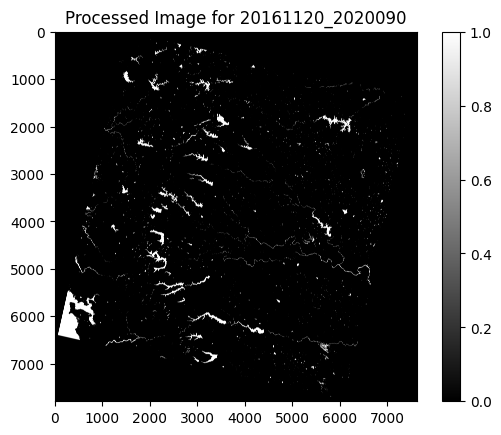

Results for D:\DatasetUSGS\2016\20161120\LC08_L2SP_147047_20161120_20200905_02_T1_MTL.txt:
20161120_2020090: 
Water Area: 1178746200.0 square meters
Land Area: 52329062700.0 square meters
Water Percentage: 2.2029423821164915 %
Land Percentage: 97.79705761788351 %
--------------------------------------------------


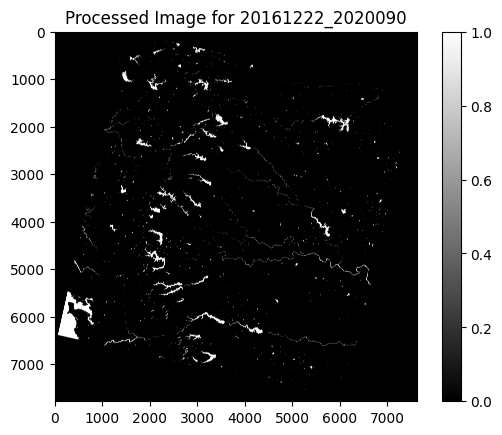

Results for D:\DatasetUSGS\2016\20161222\LC08_L2SP_147047_20161222_20200905_02_T1_MTL.txt:
20161222_2020090: 
Water Area: 1066192200.0 square meters
Land Area: 52372937700.0 square meters
Water Percentage: 1.9951526194291573 %
Land Percentage: 98.00484738057085 %
--------------------------------------------------


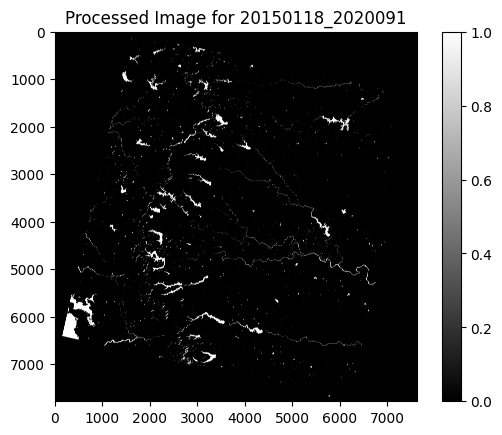

Results for D:\DatasetUSGS\2015\20150118\LC08_L2SP_147047_20150118_20200910_02_T1_MTL.txt:
20150118_2020091: 
Water Area: 1015282800.0 square meters
Land Area: 52423847100.0 square meters
Water Percentage: 1.8998864725153393 %
Land Percentage: 98.10011352748465 %
--------------------------------------------------


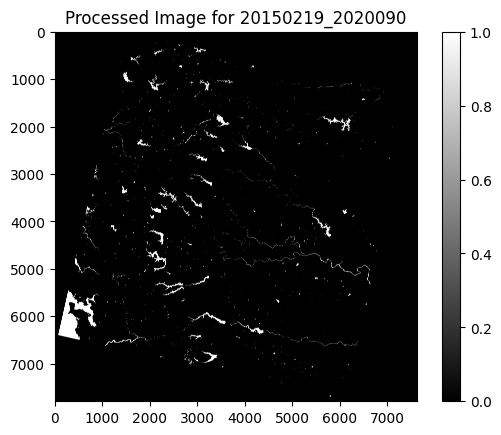

Results for D:\DatasetUSGS\2015\20150219\LC08_L2SP_147047_20150219_20200909_02_T1_MTL.txt:
20150219_2020090: 
Water Area: 947946600.0 square meters
Land Area: 52559862300.0 square meters
Water Percentage: 1.7716042190619397 %
Land Percentage: 98.22839578093806 %
--------------------------------------------------


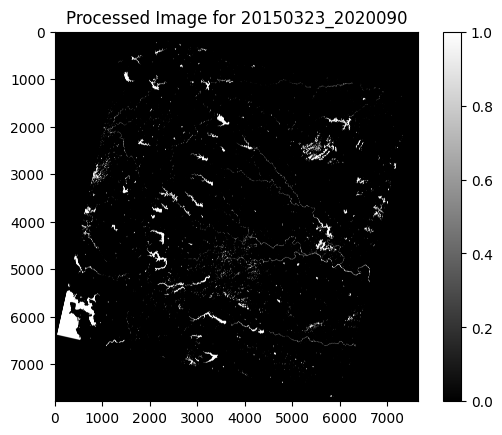

Results for D:\DatasetUSGS\2015\20150323\LC08_L2SP_147047_20150323_20200909_02_T1_MTL.txt:
20150323_2020090: 
Water Area: 1231921800.0 square meters
Land Area: 52277237100.0 square meters
Water Percentage: 2.302263435503188 %
Land Percentage: 97.69773656449681 %
--------------------------------------------------


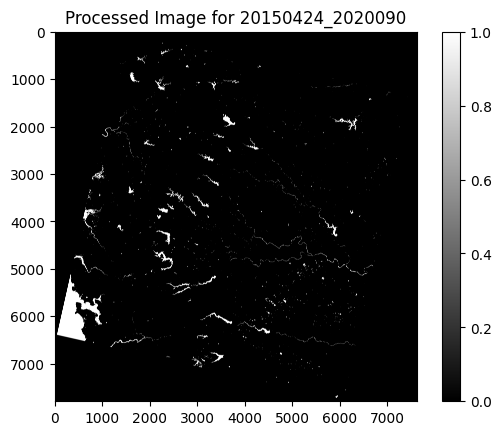

Results for D:\DatasetUSGS\2015\20150424\LC08_L2SP_147047_20150424_20200909_02_T1_MTL.txt:
20150424_2020090: 
Water Area: 1016037900.0 square meters
Land Area: 52491771000.0 square meters
Water Percentage: 1.8988591027878925 %
Land Percentage: 98.1011408972121 %
--------------------------------------------------


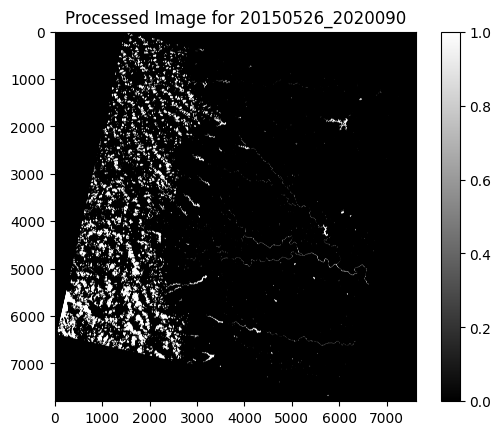

Results for D:\DatasetUSGS\2015\20150526\LC08_L2SP_147047_20150526_20200909_02_T1_MTL.txt:
20150526_2020090: 
Water Area: 2453846400.0 square meters
Land Area: 51122641500.0 square meters
Water Percentage: 4.580080733511462 %
Land Percentage: 95.41991926648853 %
--------------------------------------------------


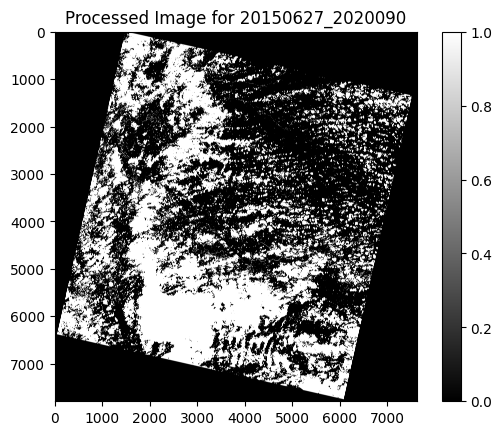

Results for D:\DatasetUSGS\2015\20150627\LC08_L2SP_147047_20150627_20200909_02_T1_MTL.txt:
20150627_2020090: 
Water Area: 15722435700.0 square meters
Land Area: 37855492200.0 square meters
Water Percentage: 29.344986482763925 %
Land Percentage: 70.65501351723607 %
--------------------------------------------------


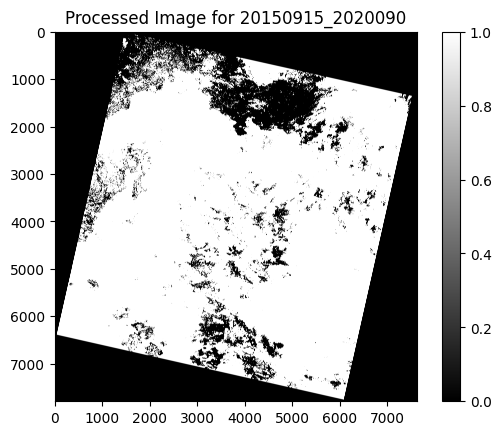

Results for D:\DatasetUSGS\2015\20150915\LC08_L2SP_147047_20150915_20200908_02_T2_MTL.txt:
20150915_2020090: 
Water Area: 31403400300.0 square meters
Land Area: 22104408600.0 square meters
Water Percentage: 58.689378140468015 %
Land Percentage: 41.310621859531985 %
--------------------------------------------------


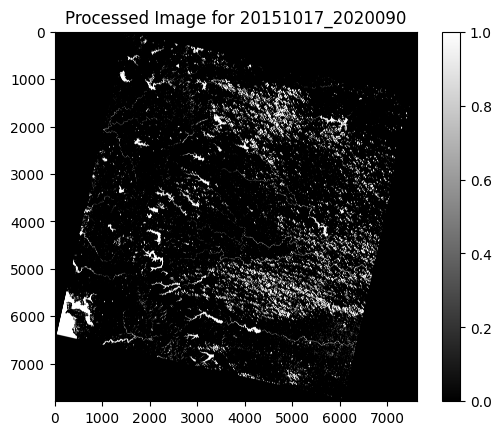

Results for D:\DatasetUSGS\2015\20151017\LC08_L2SP_147047_20151017_20200908_02_T1_MTL.txt:
20151017_2020090: 
Water Area: 3035376000.0 square meters
Land Area: 50472432900.0 square meters
Water Percentage: 5.672771997957853 %
Land Percentage: 94.32722800204215 %
--------------------------------------------------


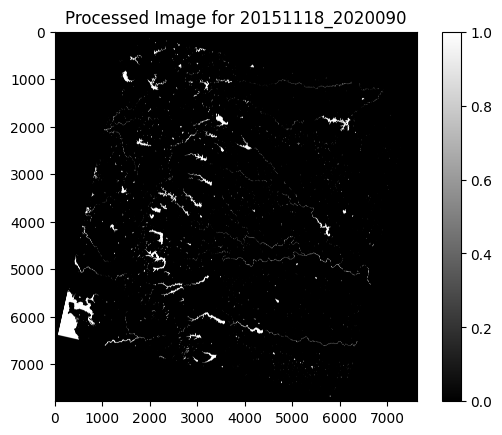

Results for D:\DatasetUSGS\2015\20151118\LC08_L2SP_147047_20151118_20200908_02_T1_MTL.txt:
20151118_2020090: 
Water Area: 999356400.0 square meters
Land Area: 52439773500.0 square meters
Water Percentage: 1.8700835920608803 %
Land Percentage: 98.12991640793912 %
--------------------------------------------------


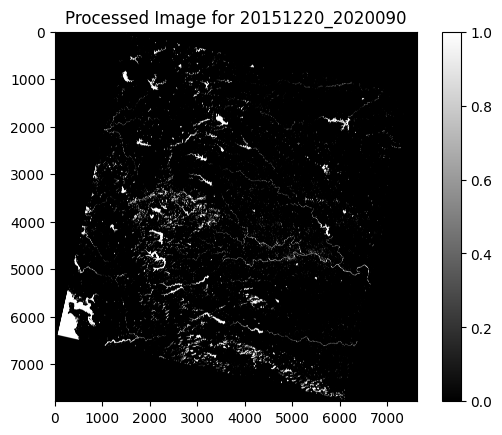

Results for D:\DatasetUSGS\2015\20151220\LC08_L2SP_147047_20151220_20200908_02_T1_MTL.txt:
20151220_2020090: 
Water Area: 1491964200.0 square meters
Land Area: 51947165700.0 square meters
Water Percentage: 2.7918946337485187 %
Land Percentage: 97.20810536625149 %
--------------------------------------------------


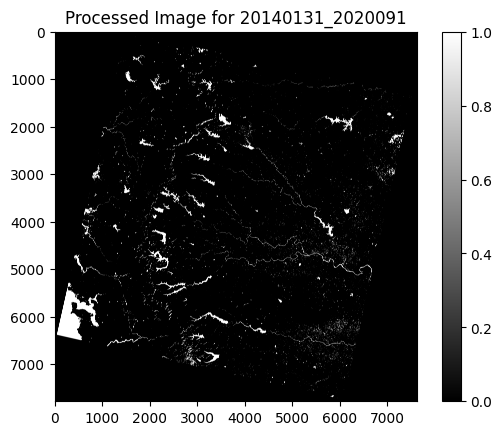

Results for D:\DatasetUSGS\2014\20140131\LC08_L2SP_147047_20140131_20200912_02_T1_MTL.txt:
20140131_2020091: 
Water Area: 1428426900.0 square meters
Land Area: 52010703000.0 square meters
Water Percentage: 2.6729980496931702 %
Land Percentage: 97.32700195030682 %
--------------------------------------------------


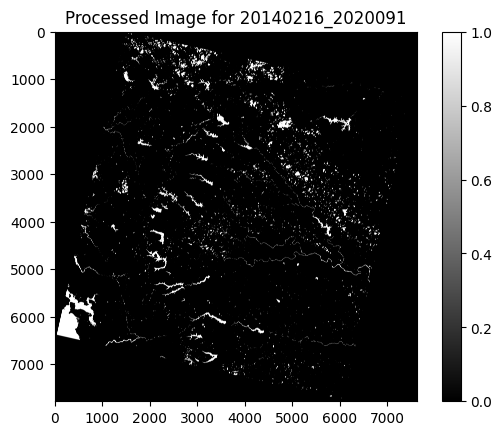

Results for D:\DatasetUSGS\2014\20140216\LC08_L2SP_147047_20140216_20200911_02_T1_MTL.txt:
20140216_2020091: 
Water Area: 1545480900.0 square meters
Land Area: 51893649000.0 square meters
Water Percentage: 2.8920397897421606 %
Land Percentage: 97.10796021025784 %
--------------------------------------------------


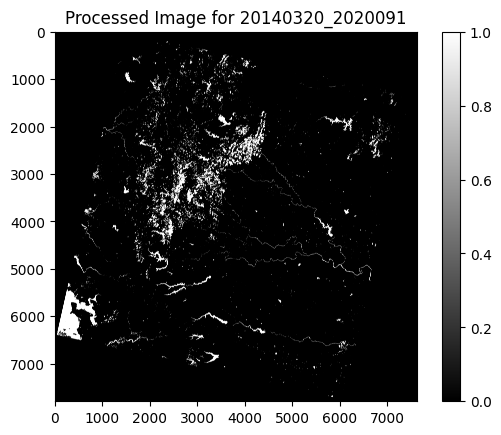

Results for D:\DatasetUSGS\2014\20140320\LC08_L2SP_147047_20140320_20200911_02_T1_MTL.txt:
20140320_2020091: 
Water Area: 1861555500.0 square meters
Land Area: 51646253400.0 square meters
Water Percentage: 3.4790351880770056 %
Land Percentage: 96.520964811923 %
--------------------------------------------------


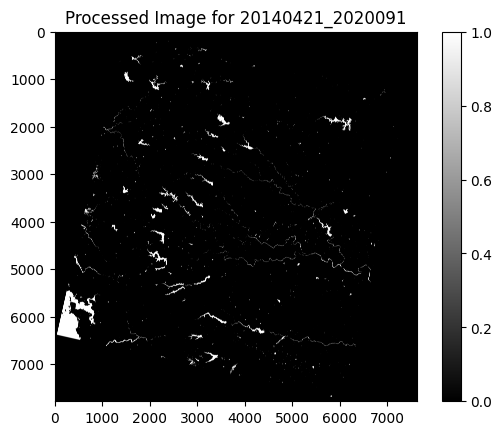

Results for D:\DatasetUSGS\2014\20140421\LC08_L2SP_147047_20140421_20200911_02_T1_MTL.txt:
20140421_2020091: 
Water Area: 878252400.0 square meters
Land Area: 52560877500.0 square meters
Water Percentage: 1.6434631358022915 %
Land Percentage: 98.35653686419771 %
--------------------------------------------------


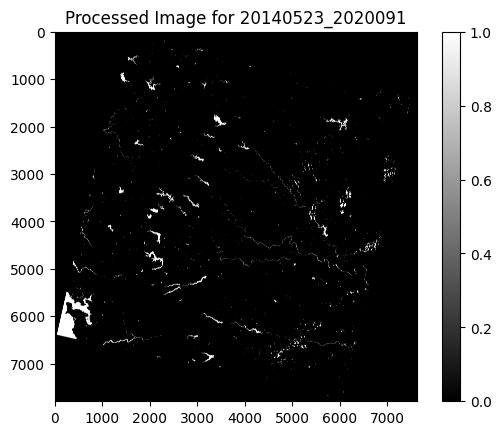

Results for D:\DatasetUSGS\2014\20140523\LC08_L2SP_147047_20140523_20200911_02_T1_MTL.txt:
20140523_2020091: 
Water Area: 762822900.0 square meters
Land Area: 52744986000.0 square meters
Water Percentage: 1.4256291103708416 %
Land Percentage: 98.57437088962917 %
--------------------------------------------------


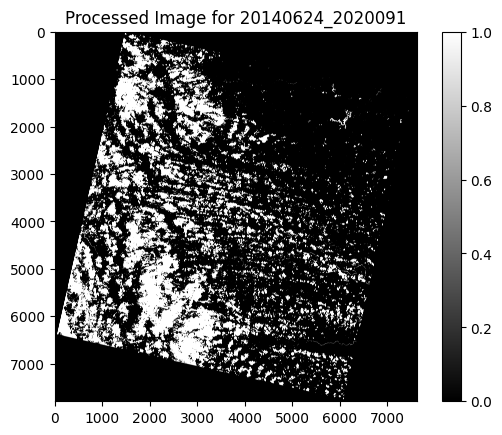

Results for D:\DatasetUSGS\2014\20140624\LC08_L2SP_147047_20140624_20200911_02_T1_MTL.txt:
20140624_2020091: 
Water Area: 9405260100.0 square meters
Land Area: 44172667800.0 square meters
Water Percentage: 17.554355811509463 %
Land Percentage: 82.44564418849055 %
--------------------------------------------------


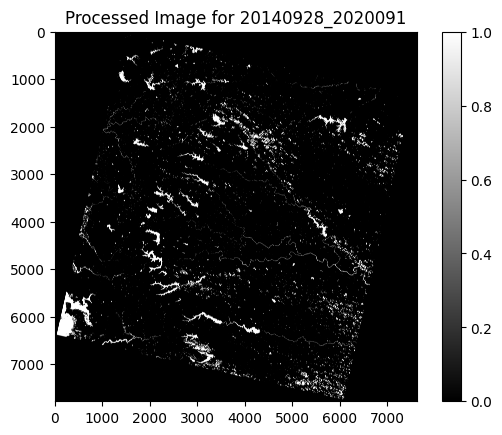

Results for D:\DatasetUSGS\2014\20140928\LC08_L2SP_147047_20140928_20200910_02_T1_MTL.txt:
20140928_2020091: 
Water Area: 1797043500.0 square meters
Land Area: 51642086400.0 square meters
Water Percentage: 3.362785852544355 %
Land Percentage: 96.63721414745564 %
--------------------------------------------------


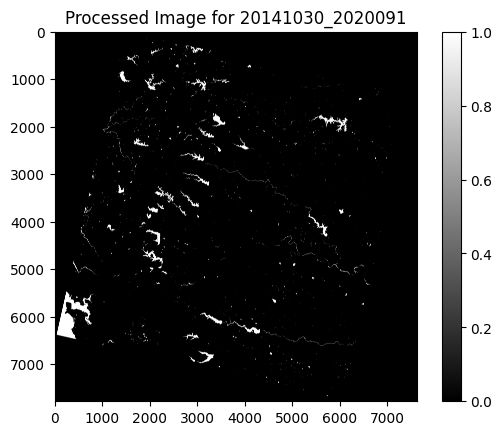

Results for D:\DatasetUSGS\2014\20141030\LC08_L2SP_147047_20141030_20200910_02_T1_MTL.txt:
20141030_2020091: 
Water Area: 931905000.0 square meters
Land Area: 52507224900.0 square meters
Water Percentage: 1.7438625998287445 %
Land Percentage: 98.25613740017126 %
--------------------------------------------------


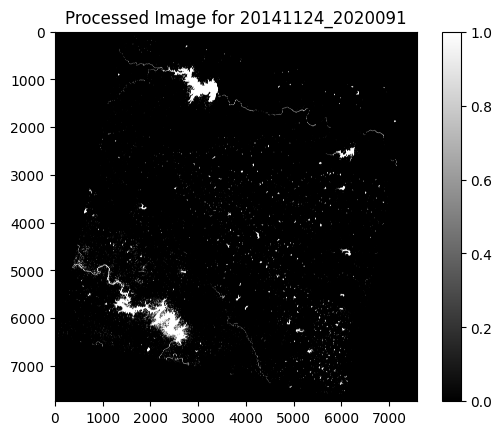

Results for D:\DatasetUSGS\2014\20141124\LC08_L2SP_146047_20141124_20200910_02_T1_MTL.txt:
20141124_2020091: 
Water Area: 1056920400.0 square meters
Land Area: 51828817500.0 square meters
Water Percentage: 1.998497973118004 %
Land Percentage: 98.001502026882 %
--------------------------------------------------


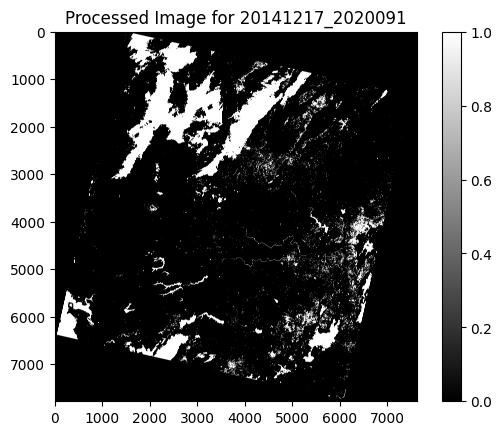

Results for D:\DatasetUSGS\2014\20141217\LC08_L2SP_147047_20141217_20200910_02_T1_MTL.txt:
20141217_2020091: 
Water Area: 5092188300.0 square meters
Land Area: 48346941600.0 square meters
Water Percentage: 9.528950620133507 %
Land Percentage: 90.4710493798665 %
--------------------------------------------------

Done Processing



In [4]:
obj.process_and_show_images_for_whole_dataset()

In [1]:
algorithm()

NameError: name 'algorithm' is not defined

In [ ]:
print(obj.X_train)
print(obj.y_train)

In [ ]:
from sklearn.model_selection import GridSearchCV
paras = {'n_estimators':range(1,18),
          'max_depth': range(1,18),
          'min_samples_split': range(1,18),
          'min_samples_leaf': range(1,18)}
rf = GradientBoostingRegressor(random_state=42)
grid = GridSearchCV(estimator = rf, param_grid = paras,cv=4,verbose=3)

In [ ]:
grid.fit(obj.X_train,obj.y_train)

In [ ]:
grid.best_score_
grid.best_params_